# 04 Riluzole Relationships Between FDG and Plasma Biomarkers
update that saves all params and pvalues, including for covariates and not just for the  biomarker

In [1]:
# install required packages - commented out so it doesn't install every time
#%conda install -n Lauren openpyxl numpy pandas statsmodels plotnine matplotlib scikit-learn scipy mizani nbconvert pandoc pyreadstat kmodes seaborn

# import required packages
import numpy as np;
import pandas as pd;
from sklearn import preprocessing 
import statsmodels as sm;
import statsmodels.formula.api as smf;
import plotnine as p9;
import itertools
import pickle

import scipy; # for spearmann correlation



# read in and clean data

In [2]:
data_folder_loc = '//admsyn/Primary/ADM/CustomerStudies/Rockefeller/Riluzole_Biomarkers/'
code_folder_loc = '//admsyn/homes/@DH-ADMDX/0/lauren.koenig-1606/code/Riluzole FDG/'

In [3]:
# read in data
composite_rr, pons_rr, para_rr, new_para_rr, ras_rr = pd.read_pickle(code_folder_loc + '/output/01_newdata.pkl')

In [4]:
all_data = new_para_rr #[~new_para_rr['ID_ADM'].isin(['APE-792_23', 'APE-792_35', 'APE-792_39', 'APE-792_65', 'APE-792_71', 'RIL_17', 'RIL_21', 'RIL_24', 'APE-792_9','APE-792_22', 'RIL_13'])].copy()#
data_name = 'new_para_rr'

In [5]:
# orig has additional 
# 
# pons (1st) is missing 'L_Hip', 'R_Hip', 'Avg_Hip', 'Temp', 'FRONTAL-gm', 'Avg_MedOrbFrontal', 'Avg PCC'
# para (1st) is missing 'L_Hip', 'R_Hip', 'Avg_Hip', 'Temp', 'FRONTAL-gm', 'Avg_MedOrbFrontal'

# para (new) is missing 'L_Hip', 'R_Hip', 'Avg_Hip', 'Temp', 'Avg PCC', 'Avg_MedOrbFrontal'
# para (new) also has 'SensMot-gm', 'Paracentral-gm', 'RASref1-gm'

# ras (new) is missing 'L_Hip', 'R_Hip', 'Avg_Hip', 'Temp', 'Avg_MedOrbFrontal'
# ras (new) also has 'SensMot-gm', 'Paracentral-gm', 'RASref1-gm', 'CO', 'Graycer-gm', 'Vermis-gm'

In [6]:
# define biomarker groups
FDG_columns = ['Avg_MedOrbFrontal', 'Graycer_gm', 'Avg_PCC', 'Avg_Hip', 'MTL_gm', 'CO', 'Temp', 'SensMot_gm', 'L_Hip',
 'Vermis_gm', 'FRONTAL_gm', 'AC_gm', 'Precun_gm', 'Par_gm', 'RASref1_gm', 'Temp_gm', 'Paracentral_gm', 'R_Hip', 'PostCing_gm']

plasma_columns = [ 'Ab40', 'Ab42', 'Ab42_40', 'GFAP','NFL',  'pTau181', 'pTau217',  'pTau231', 'pTau181_Ab42']
log10_plasma_columns = [s + '_log10' for s in plasma_columns]

cog_columns = ['MMSE', 'adascogtotal', 'bvrt', 'dstotal','tma','tmb',  'cowattotal', 'cdrtotal', 'cdrsum', 'adltotal', 'npitotal', 'gds']
vol_columns = ['VOL_Ventricles_Lz',
       'VOL_Ventricles_Rz', 'VOL_Putamen_Lz', 'VOL_Putamen_Rz',
       'VOL_ParaHip_Lz', 'VOL_ParaHip_Rz', 'VOL_Fusi_Lz', 'VOL_Fusi_Rz',
       'VOL_InfTemp_Lz', 'VOL_InfTemp_Rz', 'VOL_MidTemp_Lz', 'VOL_MidTemp_Rz',
       'VOL_SupTemp_Lz', 'VOL_SupTemp_Rz', 'VOL_Precun_Lz', 'VOL_Precun_Rz',
       'VOL_InfPar_Lz', 'VOL_InfPar_Rz', 'VOL_ParaPostCentr_Lz',
       'VOL_ParaPostCentr_Rz', 'VOL_SupraMarg_Lz', 'VOL_SupraMarg_Rz',
       'VOL_SupPar_Lz', 'VOL_SupPar_Rz', 'VOL_OrbitFront_Lz',
       'VOL_OrbitFront_Rz', 'VOL_Insula_Lz', 'VOL_Insula_Rz',
       'VOL_InfFront_Lz', 'VOL_InfFront_Rz', 'VOL_MidFront_Lz',
       'VOL_MidFront_Rz', 'VOL_SupFront_Lz', 'VOL_SupFront_Rz',
       'VOL_PrecFront_Lz', 'VOL_PrecFront_Rz', 'VOL_LatOcc_Lz',
       'VOL_LatOcc_Rz', 'VOL_Lingual_Lz', 'VOL_Lingual_Rz', 'VOL_Cuneus_Lz',
       'VOL_Cuneus_Rz', 'VOL_Pericalc_Lz', 'VOL_Pericalc_Rz',
       'VOL_AntCingulate_Lz', 'VOL_AntCingulate_Rz', 'VOL_PostCingulate_Lz',
       'VOL_PostCingulate_Rz', 'VOL_Entorhinal_Lz', 'VOL_Entorhinal_Rz',
       'VOL_Hip_Lz', 'VOL_Hip_Rz', 'VOL_TotalGrayz', 'VOL_TotalGray_Lz',
       'VOL_TotalGray_Rz', 'VOL_LatTemp_Lz', 'VOL_LatTemp_Rz',
       'VOL_Parietal_Lz', 'VOL_Parietal_Rz', 'VOL_Frontal_Lz',
       'VOL_Frontal_Rz', 'VOL_InfMidTemp_Lz', 'VOL_InfMidTemp_Rz',
       'VOL_InfInsFrontal_Lz', 'VOL_InfInsFrontal_Rz', 'VOL_MidSupFrontal_Lz',
       'VOL_MidSupFrontal_Rz', 'VOL_Inf_Mid_Fus_Temp_Lz',
       'VOL_Inf_Mid_Fus_Temp_Rz', 'VOL_Precun_InfPar_Lz',
       'VOL_Precun_InfPar_Rz', 'VOL_Precun_InfPar_Supramarg_Lz',
       'VOL_Precun_InfPar_Supramarg_Rz', 'VOL_LatOccLingCun_Lz',
       'VOL_LatOccLingCun_Rz', 'VOL_InfParSupra_Lz', 'VOL_InfParSupra_Rz']

In [7]:
print('any missing covariate data?')
all_data[all_data['timepoint'].isin(['base'])].dropna(subset = [ele for ele in FDG_columns if ele in all_data.columns], how = 'all')[['age', 'Education_years', 'sex', 'apoe4_carrier', 'race']].isna().value_counts().sort_index()

any missing covariate data?


age    Education_years  sex    apoe4_carrier  race 
False  False            False  False          False    40
                               True           False     1
                                              True      6
True   True             True   True           True      1
dtype: int64

# age correct

In [8]:
# regress out age for the plasma vars
all_data_AgeCorrect = all_data.copy()
for var in plasma_columns + log10_plasma_columns:
    Reg = smf.ols(formula = var + '~ age', data = all_data[all_data['source'].isin(['Control']) & all_data['Subject_Label'].isin(['AANDS', 'ADRC'])]).fit()
    all_data_AgeCorrect.loc[:, var] =  all_data_AgeCorrect[var] - Reg.params['age']*(all_data_AgeCorrect['age'] - all_data_AgeCorrect['age'].mean()) 

## make data subsets

In [9]:
# make data subsets
# baseline and non-trial data
baseline_data = all_data[all_data['timepoint'].isin(['base', 'not part of trial'])]

# baseline only
baseline_trial_data = all_data[all_data['timepoint'].isin(['base'])]

# baseline only and only age 70-80
baseline_trial_data_70_80 = baseline_trial_data[(baseline_trial_data['age']<=80) & (baseline_trial_data['age']>=70)]

# Analyses

# Correlations and Linear Modeling

## version using raw plasma data

In [10]:
biomarker_relationship_results_raw = pd.DataFrame()


for varlist in [ [ele for ele in FDG_columns if ele in all_data.columns], plasma_columns, cog_columns, vol_columns]:
    combinations = pd.DataFrame(list(itertools.product(plasma_columns, varlist)))

    for idx in range(combinations[0].size):
        varx = combinations[0][idx]
        vary = combinations[1][idx]
        
        temp_df_baseline =  baseline_trial_data.copy().dropna(subset = [vary, varx])

        # z-score data
        temp_df_baseline[[vary, varx, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[vary, varx, 'Education_years', 'age']])

        # basic correlation
        cor_r_baseline, cor_p_baseline = scipy.stats.spearmanr(temp_df_baseline[vary], temp_df_baseline[varx])
        cor_n = len(temp_df_baseline)

        # multivariate linear model with age as covariate
        model = smf.ols(formula = vary + ' ~ age + ' + varx , data = temp_df_baseline).fit()
        mv_age_n = len(temp_df_baseline.dropna(subset = ['age']))
        mv_age_p_val = model.pvalues
        mv_age_b_val = model.params

        # multivariate linear model with age and education years as covariates
        model = smf.ols(formula = vary + ' ~ age + Education_years + ' + varx , data = temp_df_baseline).fit()
        mv_ageedu_n = len(temp_df_baseline.dropna(subset = ['age', 'Education_years']))
        mv_ageedu_p_val = model.pvalues
        mv_ageedu_b_val = model.params

        # multivariate linear model with age and education years as covariates
        model = smf.ols(formula = vary + ' ~ age + apoe4_carrier + sex + Education_years + race + ' + varx , data = temp_df_baseline).fit()
        mv_aeasr_n = len(temp_df_baseline.dropna(subset = ['age', 'Education_years', 'apoe4_carrier', 'sex', 'race']))
        mv_aeasr_p_val = model.pvalues
        mv_aeasr_b_val = model.params

        # save results
        temp_results  =  pd.DataFrame([vary, varx, 
        cor_p_baseline, cor_r_baseline, cor_n,
        mv_age_b_val, mv_age_p_val, mv_age_n,
        mv_ageedu_p_val, mv_ageedu_b_val, mv_ageedu_n,
        mv_aeasr_p_val, mv_aeasr_b_val, mv_aeasr_n
        ]).T

        temp_results.columns = ['vary', 'varx', 
        'cor_p_baseline', 'cor_r_baseline', 'cor_n', 
        'mv_age_p_baseline', 'mv_age_B_baseline',  'mv_age_n',
        'mv_ageedu_p_baseline', 'mv_ageedu_B_baseline',  'mv_ageedu_n',
        'mv_aeasr_p_baseline', 'mv_aeasr_B_baseline',  'mv_aeasr_n']
        
        # for age model
        df_mv_age_pvals = pd.DataFrame(temp_results['mv_age_p_baseline'][0]).T
        df_mv_age_pvals.columns = 'mv_age_p_val_' + df_mv_age_pvals.columns
        temp_results[df_mv_age_pvals.columns] = df_mv_age_pvals

        df_mv_age_bvals = pd.DataFrame(temp_results['mv_age_B_baseline'][0]).T
        df_mv_age_bvals.columns = 'mv_age_b_val_' + df_mv_age_bvals.columns
        temp_results[df_mv_age_bvals.columns] = df_mv_age_bvals                

        # for age and education model
        df_mv_ageedu_pvals = pd.DataFrame(temp_results['mv_ageedu_p_baseline'][0]).T
        df_mv_ageedu_pvals.columns = 'mv_ageedu_p_val_' + df_mv_ageedu_pvals.columns
        temp_results[df_mv_ageedu_pvals.columns] = df_mv_ageedu_pvals

        df_mv_ageedu_bvals = pd.DataFrame(temp_results['mv_ageedu_B_baseline'][0]).T
        df_mv_ageedu_bvals.columns = 'mv_ageedu_b_val_' + df_mv_ageedu_bvals.columns
        temp_results[df_mv_ageedu_bvals.columns] = df_mv_ageedu_bvals      

        # for all covariates model
        df_mv_aeasr_pvals = pd.DataFrame(temp_results['mv_aeasr_p_baseline'][0]).T
        df_mv_aeasr_pvals.columns = 'mv_aeasr_p_val_' + df_mv_aeasr_pvals.columns
        temp_results[df_mv_aeasr_pvals.columns] = df_mv_aeasr_pvals

        df_mv_aeasr_bvals = pd.DataFrame(temp_results['mv_aeasr_B_baseline'][0]).T
        df_mv_aeasr_bvals.columns = 'mv_aeasr_b_val_' + df_mv_aeasr_bvals.columns
        temp_results[df_mv_aeasr_bvals.columns] = df_mv_aeasr_bvals    
        
        # remove self-correlations
        temp_results = temp_results[~(temp_results['vary'] == temp_results['varx'])]

        # rename so var2 is in the same column
        temp_results = temp_results.rename(columns = dict(zip(temp_results.columns, [ele.replace(varx, 'varx') for ele in temp_results.columns ])))

        # add to full list of results
        biomarker_relationship_results_raw = pd.concat([biomarker_relationship_results_raw, temp_results])


c:\Users\Lauren.Koenig\.conda\envs\Lauren_export_conda_20250102\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
c:\Users\Lauren.Koenig\.conda\envs\Lauren_export_conda_20250102\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
c:\Users\Lauren.Koenig\.conda\envs\Lauren_export_conda_20250102\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
c:\Users\Lauren.Koenig\.conda\envs\Lauren_export_conda_20250102\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
c:\Users\Lauren.Koenig\.conda\envs\Lauren_export_conda_20250102\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the corre

In [11]:
selected_p_column = ['mv_age_p_val_varx']
all_p_columns = ['cor_p_baseline', 'mv_age_p_val_varx', 'mv_ageedu_p_val_varx', 'mv_aeasr_p_val_varx']

# set multiple comparisons correction type
mc = 'fdr_bh' #options are bonferroni, sidak, holm-sidak, holm, simes-hochberg, hommel, fdr_bh, fdr_by, fdr_tsbh, fdr_tsbky

# apply multiple comparisons correction separately for each plasma biomarker
#for var in biomarker_relationship_results_raw['vary'].drop_duplicates().to_list():
#    biomarker_relationship_results_raw.loc[biomarker_relationship_results_raw['vary'].isin([vary]), all_p_columns] = biomarker_relationship_results_raw.loc[biomarker_relationship_results_raw['vary'].isin([vary]), all_p_columns].apply(lambda x: sm.stats.multitest.multipletests(x.replace({np.nan:1}), method=mc)[1])


In [12]:
biomarker_relationship_results_raw['type'] = 'other'
biomarker_relationship_results_raw.loc[biomarker_relationship_results_raw['varx'].isin( [ele for ele in FDG_columns if ele in all_data.columns]), 'type'] = 'FDG PET'
biomarker_relationship_results_raw.loc[biomarker_relationship_results_raw['varx'].isin(plasma_columns + log10_plasma_columns), 'type'] = 'Plasma'
biomarker_relationship_results_raw.loc[biomarker_relationship_results_raw['varx'].isin(cog_columns), 'type'] = 'Cognitive'
biomarker_relationship_results_raw.loc[biomarker_relationship_results_raw['varx'].isin(vol_columns), 'type'] = 'Volumetric'

In [13]:
biomarker_relationship_results_raw

,vary,varx,cor_p_baseline,cor_r_baseline,cor_n,mv_age_p_baseline,mv_age_B_baseline,mv_age_n,mv_ageedu_p_baseline,mv_ageedu_B_baseline,...,mv_aeasr_p_val_Education_years,mv_aeasr_p_val_varx,mv_aeasr_b_val_Intercept,mv_aeasr_b_val_apoe4_carrier[T.Yes],mv_aeasr_b_val_sex[T.M],mv_aeasr_b_val_race[T.White/NH],mv_aeasr_b_val_age,mv_aeasr_b_val_Education_years,mv_aeasr_b_val_varx,type
0,MTL_gm,Ab40,0.280507,-0.174859,40,Intercept 0.000846 age -0.265497 Ab...,Intercept 0.995881 age 0.117398 Ab...,39,Intercept 0.989331 age ...,Intercept 0.001935 age ...,...,0.005767,0.776081,-1.687562,-0.176508,0.332348,1.759247,-0.032148,0.546910,-0.041621,Plasma
0,SensMot_gm,Ab40,0.061871,0.297936,40,Intercept -0.011197 age 0.074956 Ab...,Intercept 0.944275 age 0.645840 Ab...,39,Intercept 0.945153 age ...,Intercept -0.011178 age ...,...,0.364673,0.030691,-0.959124,-0.270200,-0.115531,1.255786,0.205498,0.196599,0.386229,Plasma
0,FRONTAL_gm,Ab40,0.921283,-0.016135,40,Intercept -0.007150 age 0.112570 Ab...,Intercept 0.965985 age 0.510290 Ab...,39,Intercept 0.968147 age ...,Intercept -0.006339 age ...,...,0.010080,0.937496,-0.967226,0.021534,-0.492036,1.126660,0.381852,0.600579,0.013644,Plasma
0,AC_gm,Ab40,0.46617,-0.118574,40,Intercept -0.003857 age -0.287323 Ab...,Intercept 0.981047 age 0.088192 Ab...,39,Intercept 0.983558 age ...,Intercept -0.003270 age ...,...,0.031417,0.983020,-1.194009,0.350606,-0.444754,1.269821,-0.057071,0.467357,-0.003513,Plasma
0,Precun_gm,Ab40,0.706867,0.061351,40,Intercept -0.001608 age 0.210211 Ab...,Intercept 0.992267 age 0.217691 Ab...,39,Intercept 0.996331 age ...,Intercept -0.000709 age ...,...,0.014003,0.686471,-0.316778,-0.231659,-0.345212,0.532027,0.424241,0.574099,-0.070808,Plasma
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,VOL_Precun_InfPar_Supramarg_Rz,pTau181_Ab42,0.511106,0.124805,30,Intercept -9.714451e-17 age 3...,Intercept 1.000000 age 0.054...,30,Intercept 1.000000 age ...,Intercept -6.938894e-17 age ...,...,0.004267,0.018196,-0.248866,-0.288508,-0.637880,0.627699,0.671252,0.795737,0.507197,Plasma
0,VOL_LatOccLingCun_Lz,pTau181_Ab42,0.203086,0.239155,30,Intercept 4.857226e-17 age 9...,Intercept 1.000000 age 0.614...,30,Intercept 1.000000 age ...,Intercept 4.857226e-17 age ...,...,0.104074,0.008180,-0.724121,-0.753620,-0.015117,1.063961,0.415820,0.462157,0.643364,Plasma
0,VOL_LatOccLingCun_Rz,pTau181_Ab42,0.117861,0.291657,30,Intercept -5.377643e-17 age 6...,Intercept 1.000000 age 0.751...,30,Intercept 1.000000 age ...,Intercept -6.938894e-17 age ...,...,0.155685,0.018585,-0.911227,-0.608538,0.099392,1.235536,0.207564,0.414328,0.580274,Plasma
0,VOL_InfParSupra_Lz,pTau181_Ab42,0.556047,0.111902,30,Intercept 7.632783e-17 age 5...,Intercept 1.000000 age 0.005...,30,Intercept 1.000000 age ...,Intercept 7.632783e-17 age ...,...,0.054760,0.086230,-0.755438,-0.044399,-0.262894,0.808383,0.811650,0.556321,0.394226,Plasma


## version using log10 plasma data

In [14]:
biomarker_relationship_results_log10 = pd.DataFrame()


for varlist in [ [ele for ele in FDG_columns if ele in all_data.columns], log10_plasma_columns, cog_columns, vol_columns]:
    combinations = pd.DataFrame(list(itertools.product(log10_plasma_columns, varlist)))

    for idx in range(combinations[0].size):
        varx = combinations[0][idx]
        vary = combinations[1][idx]
        
        temp_df_baseline =  baseline_trial_data.copy().dropna(subset = [vary, varx])

        # z-score data
        temp_df_baseline[[vary, varx, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[vary, varx, 'Education_years', 'age']])

        # basic correlation
        cor_r_baseline, cor_p_baseline = scipy.stats.spearmanr(temp_df_baseline[vary], temp_df_baseline[varx])
        cor_n = len(temp_df_baseline)

        # multivariate linear model with age as covariate
        model = smf.ols(formula = vary + ' ~ age + ' + varx , data = temp_df_baseline).fit()
        mv_age_n = len(temp_df_baseline.dropna(subset = ['age']))
        mv_age_p_val = model.pvalues
        mv_age_b_val = model.params

        # multivariate linear model with age and education years as covariates
        model = smf.ols(formula = vary + ' ~ age + Education_years + ' + varx , data = temp_df_baseline).fit()
        mv_ageedu_n = len(temp_df_baseline.dropna(subset = ['age', 'Education_years']))
        mv_ageedu_p_val = model.pvalues
        mv_ageedu_b_val = model.params

        # multivariate linear model with age and education years as covariates
        model = smf.ols(formula = vary + ' ~ age + apoe4_carrier + sex + Education_years + race + ' + varx , data = temp_df_baseline).fit()
        mv_aeasr_n = len(temp_df_baseline.dropna(subset = ['age', 'Education_years', 'apoe4_carrier', 'sex', 'race']))
        mv_aeasr_p_val = model.pvalues
        mv_aeasr_b_val = model.params

        # save results
        temp_results  =  pd.DataFrame([vary, varx, 
        cor_p_baseline, cor_r_baseline, cor_n,
        mv_age_b_val, mv_age_p_val, mv_age_n,
        mv_ageedu_p_val, mv_ageedu_b_val, mv_ageedu_n,
        mv_aeasr_p_val, mv_aeasr_b_val, mv_aeasr_n
        ]).T

        temp_results.columns = ['vary', 'varx', 
        'cor_p_baseline', 'cor_r_baseline', 'cor_n', 
        'mv_age_p_baseline', 'mv_age_B_baseline',  'mv_age_n',
        'mv_ageedu_p_baseline', 'mv_ageedu_B_baseline',  'mv_ageedu_n',
        'mv_aeasr_p_baseline', 'mv_aeasr_B_baseline',  'mv_aeasr_n']
        
        # for age model
        df_mv_age_pvals = pd.DataFrame(temp_results['mv_age_p_baseline'][0]).T
        df_mv_age_pvals.columns = 'mv_age_p_val_' + df_mv_age_pvals.columns
        temp_results[df_mv_age_pvals.columns] = df_mv_age_pvals

        df_mv_age_bvals = pd.DataFrame(temp_results['mv_age_B_baseline'][0]).T
        df_mv_age_bvals.columns = 'mv_age_b_val_' + df_mv_age_bvals.columns
        temp_results[df_mv_age_bvals.columns] = df_mv_age_bvals                

        # for age and education model
        df_mv_ageedu_pvals = pd.DataFrame(temp_results['mv_ageedu_p_baseline'][0]).T
        df_mv_ageedu_pvals.columns = 'mv_ageedu_p_val_' + df_mv_ageedu_pvals.columns
        temp_results[df_mv_ageedu_pvals.columns] = df_mv_ageedu_pvals

        df_mv_ageedu_bvals = pd.DataFrame(temp_results['mv_ageedu_B_baseline'][0]).T
        df_mv_ageedu_bvals.columns = 'mv_ageedu_b_val_' + df_mv_ageedu_bvals.columns
        temp_results[df_mv_ageedu_bvals.columns] = df_mv_ageedu_bvals      

        # for all covariates model
        df_mv_aeasr_pvals = pd.DataFrame(temp_results['mv_aeasr_p_baseline'][0]).T
        df_mv_aeasr_pvals.columns = 'mv_aeasr_p_val_' + df_mv_aeasr_pvals.columns
        temp_results[df_mv_aeasr_pvals.columns] = df_mv_aeasr_pvals

        df_mv_aeasr_bvals = pd.DataFrame(temp_results['mv_aeasr_B_baseline'][0]).T
        df_mv_aeasr_bvals.columns = 'mv_aeasr_b_val_' + df_mv_aeasr_bvals.columns
        temp_results[df_mv_aeasr_bvals.columns] = df_mv_aeasr_bvals    
        
        # remove self-correlations
        temp_results = temp_results[~(temp_results['vary'] == temp_results['varx'])]

        # rename so var2 is in the same column
        temp_results = temp_results.rename(columns = dict(zip(temp_results.columns, [ele.replace(varx, 'varx') for ele in temp_results.columns ])))

        # add to full list of results
        biomarker_relationship_results_log10 = pd.concat([biomarker_relationship_results_log10, temp_results])

c:\Users\Lauren.Koenig\.conda\envs\Lauren_export_conda_20250102\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
c:\Users\Lauren.Koenig\.conda\envs\Lauren_export_conda_20250102\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
c:\Users\Lauren.Koenig\.conda\envs\Lauren_export_conda_20250102\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
c:\Users\Lauren.Koenig\.conda\envs\Lauren_export_conda_20250102\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
c:\Users\Lauren.Koenig\.conda\envs\Lauren_export_conda_20250102\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the corre

In [15]:
selected_p_column = ['mv_age_p_val_varx']
all_p_columns = ['cor_p_baseline', 'mv_age_p_val_varx', 'mv_ageedu_p_val_varx', 'mv_aeasr_p_val_varx']


In [16]:
# set multiple comparisons correction type
mc = 'fdr_bh' #options are bonferroni, sidak, holm-sidak, holm, simes-hochberg, hommel, fdr_bh, fdr_by, fdr_tsbh, fdr_tsbky

# apply multiple comparisons correction separately for each plasma biomarker
#for var in biomarker_relationship_results_log10['vary'].drop_duplicates().to_list():
#    biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]), all_p_columns] = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]), all_p_columns].apply(lambda x: sm.stats.multitest.multipletests(x.replace({np.nan:1}), method=mc)[1])

In [17]:
biomarker_relationship_results_log10['type'] = 'other'
biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['varx'].isin( [ele for ele in FDG_columns if ele in all_data.columns]), 'type'] = 'FDG PET'
biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['varx'].isin(log10_plasma_columns + log10_plasma_columns), 'type'] = 'Plasma'
biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['varx'].isin(cog_columns), 'type'] = 'Cognitive'
biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['varx'].isin(vol_columns), 'type'] = 'Volumetric'

In [18]:
biomarker_relationship_results_log10['type'].value_counts()

Plasma    963
Name: type, dtype: int64

## compare raw and log10 plasma results

In [19]:
temp_a = biomarker_relationship_results_raw[['vary', 'varx'] + selected_p_column].copy()
temp_b = biomarker_relationship_results_log10[['vary', 'varx'] + selected_p_column].copy()

temp_a[selected_p_column] = temp_a[selected_p_column]< 0.05
temp_b[selected_p_column] = temp_b[selected_p_column]< 0.05


temp_a = temp_a.replace({True:1, False:0})
temp_b = temp_b.replace({True:1, False:0})

temp_c = temp_a.copy()
temp_c[selected_p_column] = (temp_a[selected_p_column] - temp_b[selected_p_column])

temp_c[(temp_c[selected_p_column] != 0).any(axis = 1)]

# 0 means they were the same; 1 means A was sig but B wasn't; -1 means B was significant but A wasn't

,vary,varx,mv_age_p_val_varx
0,SensMot_gm,pTau181,1
0,GFAP,Ab40,-1
0,Ab40,GFAP,-1
0,MMSE,Ab40,1
0,cowattotal,Ab40,1
...,...,...,...
0,VOL_Precun_Lz,pTau181_Ab42,1
0,VOL_Precun_Rz,pTau181_Ab42,1
0,VOL_SupFront_Rz,pTau181_Ab42,1
0,VOL_Entorhinal_Lz,pTau181_Ab42,1


In [20]:
temp_c[selected_p_column].melt().value_counts().sort_index()

variable           value
mv_age_p_val_varx  -1        33
                    0       889
                    1        41
dtype: int64

In [21]:
temp_c.loc[~(temp_c['vary'].isin( [ele for ele in FDG_columns if ele in all_data.columns]) & temp_c['varx'].isin( [ele for ele in FDG_columns if ele in all_data.columns]))  ,selected_p_column].melt().value_counts().sort_index()

variable           value
mv_age_p_val_varx  -1        33
                    0       889
                    1        41
dtype: int64

In [22]:
# the significant pvalues lost by the log transform
biomarker_relationship_results_raw.loc[(temp_c['mv_age_p_val_varx'] == 1), ['vary', 'varx', 'mv_age_p_val_varx', 'mv_age_B_baseline']].round(3)

,vary,varx,mv_age_p_val_varx,mv_age_B_baseline
0,SensMot_gm,pTau181,0.025,Intercept 0.978751 age 0.387629 pT...
0,MMSE,Ab40,0.031,Intercept 1.000000 age 0.696516 Ab...
0,cowattotal,Ab40,0.025,Intercept 1.000000 age 0.461738 Ab...
0,bvrt,Ab42_40,0.043,Intercept 1.000000 age 0.967007 Ab...
0,tmb,Ab42_40,0.046,Intercept 1.000000 age 0.845447 Ab...
0,dstotal,pTau231,0.023,Intercept 1.000000 age 0.120646 pT...
0,gds,pTau231,-0.010,Intercept 1.000000 age 0.274766 pT...
0,MMSE,pTau181_Ab42,0.006,Intercept 1.000000 age 0.426...
0,VOL_SupPar_Rz,Ab40,0.035,Intercept 1.000000 age 0.002443 Ab...
0,VOL_PrecFront_Rz,Ab40,0.042,Intercept 1.000000 age 0.140296 Ab...


In [23]:
biomarker_relationship_results_log10.loc[(temp_c['mv_age_p_val_varx'] == 1), ['vary', 'varx', 'mv_age_p_val_varx', 'mv_age_B_baseline']].round(3)

,vary,varx,mv_age_p_val_varx,mv_age_B_baseline
0,SensMot_gm,pTau181_log10,0.078,Intercept 0.984255 age 0.3...
0,MMSE,Ab40_log10,0.093,Intercept 1.000000 age 0.713216 ...
0,cowattotal,Ab40_log10,0.085,Intercept 1.000000 age 0.473830 ...
0,bvrt,Ab42_40_log10,0.087,Intercept 1.000000 age 0.9...
0,tmb,Ab42_40_log10,0.070,Intercept 1.000000 age 0.8...
0,dstotal,pTau231_log10,0.076,Intercept 1.000000 age 0.1...
0,gds,pTau231_log10,0.062,Intercept 1.000000 age 0.2...
0,MMSE,pTau181_Ab42_log10,0.072,Intercept 1.000000 age ...
0,VOL_SupPar_Rz,Ab40_log10,0.117,Intercept 1.000000 age 0.002300 ...
0,VOL_PrecFront_Rz,Ab40_log10,0.064,Intercept 1.000000 age 0.134408 ...


In [24]:
# the significant pvalues gained by the log transform
biomarker_relationship_results_raw.loc[(temp_c['mv_age_p_val_varx'] == -1), ['vary', 'varx', 'mv_age_p_val_varx', 'mv_age_B_baseline']].round(3)

,vary,varx,mv_age_p_val_varx,mv_age_B_baseline
0,GFAP,Ab40,0.080,Intercept 0.698653 age 0.861461 Ab...
0,Ab40,GFAP,0.081,Intercept 0.833191 age 0.271954 GF...
0,tmb,Ab42,0.075,Intercept 1.000000 age 0.861328 Ab...
0,adascogtotal,pTau181,0.053,Intercept 1.000000 age 0.590977 pT...
0,tmb,pTau217,0.319,Intercept 1.000000 age 0.420471 pT...
0,cdrtotal,pTau217,0.078,Intercept 1.000000 age 0.536218 pT...
0,cdrsum,pTau217,0.060,Intercept 1.000000 age 0.142983 pT...
0,MMSE,pTau231,0.081,Intercept 1.000000 age 0.102625 pT...
0,npitotal,pTau231,0.085,Intercept 1.000000 age 0.906985 pT...
0,adascogtotal,pTau181_Ab42,0.111,Intercept 1.000000 age 0.747...


In [25]:
# the significant pvalues gained by the log transform
biomarker_relationship_results_log10.loc[(temp_c['mv_age_p_val_varx'] == -1), ['vary', 'varx', 'mv_age_p_val_varx', 'mv_age_B_baseline']].round(3)

,vary,varx,mv_age_p_val_varx,mv_age_B_baseline
0,GFAP_log10,Ab40_log10,0.024,Intercept 0.699463 age 0.853577 ...
0,Ab40_log10,GFAP_log10,0.025,Intercept 0.827717 age 0.515622 ...
0,tmb,Ab42_log10,-0.046,Intercept 1.000000 age 0.835259 ...
0,adascogtotal,pTau181_log10,0.010,Intercept 1.000000 age 0.5...
0,tmb,pTau217_log10,0.018,Intercept 1.000000 age 0.5...
0,cdrtotal,pTau217_log10,-0.003,Intercept 1.000000 age 0.4...
0,cdrsum,pTau217_log10,-0.030,Intercept 1.000000 age 0.1...
0,MMSE,pTau231_log10,0.047,Intercept 1.000000 age 0.1...
0,npitotal,pTau231_log10,-0.022,Intercept 1.000000 age 0.9...
0,adascogtotal,pTau181_Ab42_log10,0.031,Intercept 1.000000 age ...


## repeat without pTau181 outlier ppt and see if results change

## save results

In [26]:
with pd.ExcelWriter(code_folder_loc + 'output/04_model_results_raw_' + data_name +'.xlsx') as writer:
   
    # use to_excel function and specify the sheet_name and index 
    # to store the dataframe in specified sheet
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['vary'].isin(['Ab40'])].to_excel(writer, sheet_name='Ab40', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['vary'].isin(['Ab42'])].to_excel(writer, sheet_name='Ab42', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['vary'].isin(['Ab42_40'])].to_excel(writer, sheet_name='Ab42_40', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['vary'].isin(['pTau181'])].to_excel(writer, sheet_name='pTau181', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['vary'].isin(['pTau217'])].to_excel(writer, sheet_name='pTau217', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['vary'].isin(['pTau231'])].to_excel(writer, sheet_name='pTau231', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['vary'].isin(['GFAP'])].to_excel(writer, sheet_name='GFAP', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['vary'].isin(['NFL'])].to_excel(writer, sheet_name='NFL', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['vary'].isin(['pTau181_Ab42'])].to_excel(writer, sheet_name='pTau181_Ab42', index=False)
    biomarker_relationship_results_raw[(biomarker_relationship_results_raw[all_p_columns].min(axis = 1)<0.05)].to_excel(writer, sheet_name='Significant', index=False)

In [27]:
with pd.ExcelWriter(code_folder_loc + 'output/04_model_results_log10_' + data_name + '.xlsx') as writer:
   
    # use to_excel function and specify the sheet_name and index 
    # to store the dataframe in specified sheet
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['vary'].isin(['Ab40_log10'])].to_excel(writer, sheet_name='Ab40', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['vary'].isin(['Ab42_log10'])].to_excel(writer, sheet_name='Ab42', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['vary'].isin(['Ab42_40_log10'])].to_excel(writer, sheet_name='Ab42_40', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['vary'].isin(['pTau181_log10'])].to_excel(writer, sheet_name='pTau181', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['vary'].isin(['pTau217_log10'])].to_excel(writer, sheet_name='pTau217', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['vary'].isin(['pTau231_log10'])].to_excel(writer, sheet_name='pTau231', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['vary'].isin(['GFAP_log10'])].to_excel(writer, sheet_name='GFAP', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['vary'].isin(['NFL_log10'])].to_excel(writer, sheet_name='NFL', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['vary'].isin(['pTau181_Ab42_log10'])].to_excel(writer, sheet_name='pTau181_Ab42', index=False)
    biomarker_relationship_results_log10.loc[(biomarker_relationship_results_log10[all_p_columns].min(axis = 1)<0.05), :].round(3).to_excel(writer, sheet_name='Significant', index=False)

In [28]:
biomarker_relationship_results_log10.columns[biomarker_relationship_results_log10.columns.str.contains('mv_ageedu')].sort_values()

Index(['mv_ageedu_B_baseline', 'mv_ageedu_b_val_Education_years',
       'mv_ageedu_b_val_Intercept', 'mv_ageedu_b_val_age',
       'mv_ageedu_b_val_varx', 'mv_ageedu_n', 'mv_ageedu_p_baseline',
       'mv_ageedu_p_val_Education_years', 'mv_ageedu_p_val_Intercept',
       'mv_ageedu_p_val_age', 'mv_ageedu_p_val_varx'],
      dtype='object')

In [29]:
temp_df = biomarker_relationship_results_log10.copy()
temp_df = temp_df[temp_df['vary'].isin(['Ab42_40_log10', 'GFAP_log10', 'NFL_log10', 'pTau181_log10', 'pTau217_log10', 'pTau231_log10'])]
temp_df = temp_df[~temp_df['varx'].isin(['RASref1_gm', 'Paracentral_gm', 'Ab42_log10', 'pTau181_Ab42_log10', 'Ab40_log10'])]

temp_df = temp_df[['type', 'vary', 'varx','mv_ageedu_n', 'mv_ageedu_B_baseline', 'mv_ageedu_p_baseline', 
'mv_ageedu_b_val_Intercept', 'mv_ageedu_b_val_Education_years', 'mv_ageedu_b_val_age', 'mv_ageedu_b_val_varx', 
'mv_ageedu_p_val_Intercept', 'mv_ageedu_p_val_Education_years', 'mv_ageedu_p_val_age', 'mv_ageedu_p_val_varx']]

temp_df[['mv_ageedu_b_val_Intercept', 'mv_ageedu_b_val_Education_years', 'mv_ageedu_b_val_age', 'mv_ageedu_b_val_varx', 
'mv_ageedu_p_val_Intercept', 'mv_ageedu_p_val_Education_years', 'mv_ageedu_p_val_age', 'mv_ageedu_p_val_varx']] = temp_df[[
    'mv_ageedu_b_val_Intercept', 'mv_ageedu_b_val_Education_years', 'mv_ageedu_b_val_age', 'mv_ageedu_b_val_varx', 
'mv_ageedu_p_val_Intercept', 'mv_ageedu_p_val_Education_years', 'mv_ageedu_p_val_age', 'mv_ageedu_p_val_varx']].round(4)

temp_df = temp_df.rename(columns = {'mv_ageedu_p_baseline':'p-values', 'mv_ageedu_B_baseline':'B-values', 
'mv_ageedu_n':'number of subjects'})

temp_df.columns

Index(['type', 'vary', 'varx', 'number of subjects', 'B-values', 'p-values',
       'mv_ageedu_b_val_Intercept', 'mv_ageedu_b_val_Education_years',
       'mv_ageedu_b_val_age', 'mv_ageedu_b_val_varx',
       'mv_ageedu_p_val_Intercept', 'mv_ageedu_p_val_Education_years',
       'mv_ageedu_p_val_age', 'mv_ageedu_p_val_varx'],
      dtype='object')

In [30]:
temp_df = biomarker_relationship_results_log10.copy()
temp_df = temp_df[temp_df['vary'].isin(['Ab42_40_log10', 'GFAP_log10', 'NFL_log10', 'pTau181_log10', 'pTau217_log10', 'pTau231_log10'])]
temp_df = temp_df[~temp_df['varx'].isin(['RASref1_gm', 'Paracentral_gm', 'Ab42_log10', 'pTau181_Ab42_log10', 'Ab40_log10'])]

temp_df = temp_df[['type', 'vary', 'varx','mv_ageedu_n', 'mv_ageedu_B_baseline', 'mv_ageedu_p_baseline', 
'mv_ageedu_b_val_Education_years', 'mv_ageedu_b_val_age', 'mv_ageedu_b_val_varx', 
'mv_ageedu_p_val_Education_years', 'mv_ageedu_p_val_age', 'mv_ageedu_p_val_varx']]

temp_df[[
    'mv_ageedu_b_val_Education_years', 'mv_ageedu_b_val_age', 'mv_ageedu_b_val_varx', 
    'mv_ageedu_p_val_Education_years', 'mv_ageedu_p_val_age', 'mv_ageedu_p_val_varx'
]] = temp_df[[
    'mv_ageedu_b_val_Education_years', 'mv_ageedu_b_val_age', 'mv_ageedu_b_val_varx', 
    'mv_ageedu_p_val_Education_years', 'mv_ageedu_p_val_age', 'mv_ageedu_p_val_varx']].round(4)

temp_df = temp_df.rename(columns = {'mv_ageedu_p_baseline':'p-values', 'mv_ageedu_B_baseline':'B-values', 
'mv_ageedu_n':'number of subjects'})

temp_df = temp_df.rename(columns = dict(zip(temp_df.columns, [ele.replace('mv_ageedu_', '') for ele in temp_df.columns])))

temp_df

,type,vary,varx,number of subjects,B-values,p-values,b_val_Education_years,b_val_age,b_val_varx,p_val_Education_years,p_val_age,p_val_varx
0,Plasma,GFAP_log10,Ab42_40_log10,35,Intercept -0.063145 age ...,Intercept 0.712211 age ...,-0.3324,-0.1495,-0.1016,0.0675,0.4085,0.5586
0,Plasma,NFL_log10,Ab42_40_log10,35,Intercept -0.077196 age ...,Intercept 0.656635 age ...,-0.0483,0.2240,0.2423,0.7878,0.2249,0.1739
0,Plasma,pTau181_log10,Ab42_40_log10,35,Intercept -0.115404 age ...,Intercept 0.440181 age ...,-0.3127,-0.1250,0.4822,0.0491,0.4267,0.0030
0,Plasma,pTau217_log10,Ab42_40_log10,32,Intercept -0.102342 age ...,Intercept 0.554923 age ...,-0.1485,-0.2219,0.1176,0.4085,0.2254,0.5038
0,Plasma,pTau231_log10,Ab42_40_log10,33,Intercept -0.113970 age ...,Intercept 0.451919 age ...,-0.2221,-0.1671,0.5327,0.1628,0.2987,0.0014
0,Plasma,Ab42_40_log10,GFAP_log10,35,Intercept 0.062454 age ...,Intercept 0.725721 age ...,-0.0106,-0.2033,-0.1098,0.9564,0.2776,0.5586
0,Plasma,NFL_log10,GFAP_log10,41,Intercept -0.035960 age ...,Intercept 0.815280 age ...,0.0317,0.1572,0.3390,0.8504,0.3337,0.0404
0,Plasma,pTau181_log10,GFAP_log10,41,Intercept -0.056308 age ...,Intercept 0.716412 age ...,-0.2569,-0.2553,0.1566,0.1350,0.1225,0.3361
0,Plasma,pTau217_log10,GFAP_log10,37,Intercept -0.074073 age ...,Intercept 0.619550 age ...,-0.0615,-0.2422,0.3431,0.6982,0.1263,0.0267
0,Plasma,pTau231_log10,GFAP_log10,36,Intercept -0.065456 age ...,Intercept 0.697943 age ...,-0.2705,-0.3303,0.0073,0.1441,0.0688,0.9667


In [31]:
temp_df = biomarker_relationship_results_log10.copy()
temp_df = temp_df[temp_df['vary'].isin(['Ab42_40_log10', 'GFAP_log10', 'NFL_log10', 'pTau181_log10', 'pTau217_log10', 'pTau231_log10'])]
temp_df = temp_df[~temp_df['varx'].isin(['RASref1_gm', 'Paracentral_gm', 'Ab42_log10', 'pTau181_Ab42_log10', 'Ab40_log10'])]

temp_df = temp_df[['type', 'vary', 'varx','mv_ageedu_n', 'mv_ageedu_B_baseline', 'mv_ageedu_p_baseline', 
'mv_ageedu_b_val_Education_years', 'mv_ageedu_b_val_age', 'mv_ageedu_b_val_varx', 
'mv_ageedu_p_val_Education_years', 'mv_ageedu_p_val_age', 'mv_ageedu_p_val_varx']]

temp_df[[
    'mv_ageedu_b_val_Education_years', 'mv_ageedu_b_val_age', 'mv_ageedu_b_val_varx', 
    'mv_ageedu_p_val_Education_years', 'mv_ageedu_p_val_age', 'mv_ageedu_p_val_varx'
]] = temp_df[[
    'mv_ageedu_b_val_Education_years', 'mv_ageedu_b_val_age', 'mv_ageedu_b_val_varx', 
    'mv_ageedu_p_val_Education_years', 'mv_ageedu_p_val_age', 'mv_ageedu_p_val_varx']].round(4)

temp_df = temp_df.rename(columns = {'mv_ageedu_p_baseline':'p-values', 'mv_ageedu_B_baseline':'B-values', 
'mv_ageedu_n':'number of subjects'})

temp_df = temp_df.rename(columns = dict(zip(temp_df.columns, [ele.replace('mv_ageedu_', '') for ele in temp_df.columns])))

with pd.ExcelWriter(code_folder_loc + 'output/04_model_subset_results_log10_' + data_name + '.xlsx') as writer:
   
    # use to_excel function and specify the sheet_name and index 
    # to store the dataframe in specified sheet
    temp_df[temp_df['vary'].isin(['Ab42_40_log10'])].to_excel(writer, sheet_name='Ab42_40', index=False)
    temp_df[temp_df['vary'].isin(['pTau181_log10'])].to_excel(writer, sheet_name='pTau181', index=False)
    temp_df[temp_df['vary'].isin(['pTau217_log10'])].to_excel(writer, sheet_name='pTau217', index=False)
    temp_df[temp_df['vary'].isin(['pTau231_log10'])].to_excel(writer, sheet_name='pTau231', index=False)
    temp_df[temp_df['vary'].isin(['GFAP_log10'])].to_excel(writer, sheet_name='GFAP', index=False)
    temp_df[temp_df['vary'].isin(['NFL_log10'])].to_excel(writer, sheet_name='NFL', index=False)
    temp_df.loc[(temp_df['p_val_varx']<0.05), :].to_excel(writer, sheet_name='Significant', index=False)

In [32]:
temp_df.loc[(temp_df['p_val_Education_years']<0.05), 'type'].value_counts()

Plasma    1
Name: type, dtype: int64

In [33]:
temp_df.loc[(temp_df['p_val_Education_years']<0.05) & (temp_df['p_val_varx']<0.05), 'type'].value_counts()

Plasma    1
Name: type, dtype: int64

In [34]:
temp_df.loc[(temp_df['p_val_Education_years']>0.05) & (temp_df['p_val_varx']<0.05), 'type'].value_counts()

Plasma    13
Name: type, dtype: int64

In [35]:
temp_df.loc[(temp_df['p_val_Education_years']<0.05)  & (temp_df['p_val_varx']<0.05) & ~(temp_df['type'].isin(['Volumetric'])), :]

,type,vary,varx,number of subjects,B-values,p-values,b_val_Education_years,b_val_age,b_val_varx,p_val_Education_years,p_val_age,p_val_varx
0,Plasma,pTau181_log10,Ab42_40_log10,35,Intercept -0.115404 age ...,Intercept 0.440181 age ...,-0.3127,-0.125,0.4822,0.0491,0.4267,0.003


In [36]:
temp_df.loc[(temp_df['p_val_age']<0.05), 'type'].value_counts()

Plasma    1
Name: type, dtype: int64

In [37]:
temp_df.loc[(temp_df['p_val_age']<0.05)& (temp_df['p_val_varx']<0.05), 'type'].value_counts()

Series([], Name: type, dtype: int64)

In [38]:
temp_df.loc[(temp_df['p_val_age']<0.05) & (temp_df['p_val_varx']<0.05)& ~(temp_df['type'].isin(['Volumetric'])), :]

,type,vary,varx,number of subjects,B-values,p-values,b_val_Education_years,b_val_age,b_val_varx,p_val_Education_years,p_val_age,p_val_varx


In [39]:
temp_df.columns

Index(['type', 'vary', 'varx', 'number of subjects', 'B-values', 'p-values',
       'b_val_Education_years', 'b_val_age', 'b_val_varx',
       'p_val_Education_years', 'p_val_age', 'p_val_varx'],
      dtype='object')

In [40]:
# change log10 plasma names so that graphs will graph raw values (after saved results so that its obvious which models the pvalues belong to)
biomarker_relationship_results_log10 = biomarker_relationship_results_log10.replace('_log10', '', regex = True)

# Save

In [41]:
import pickle
# Saving the objects:
with open(code_folder_loc + '/output/04_data_' + data_name + '.pkl', 'wb') as f: 
    pickle.dump([biomarker_relationship_results_log10, biomarker_relationship_results_raw, all_data], f)

# Plot Results
the notes listed and graphs plotted are for relationships with significant mv_age_p_val_varx

In [42]:
graphing_pval = 0.05
pvals_to_consider = ['mv_ageedu_p_val_varx']
Bval_to_grab = 'mv_ageedu_b_val_varx'

## Ab40

In [43]:
varx = 'Ab40'

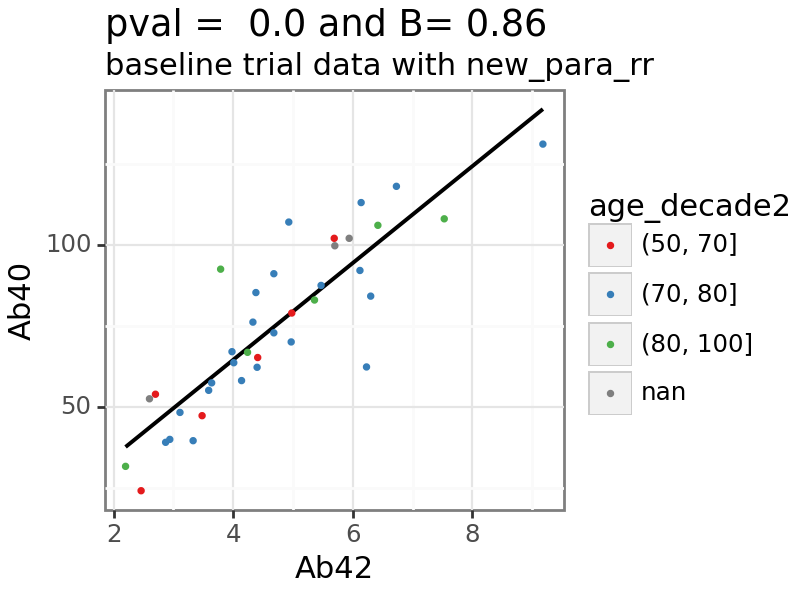

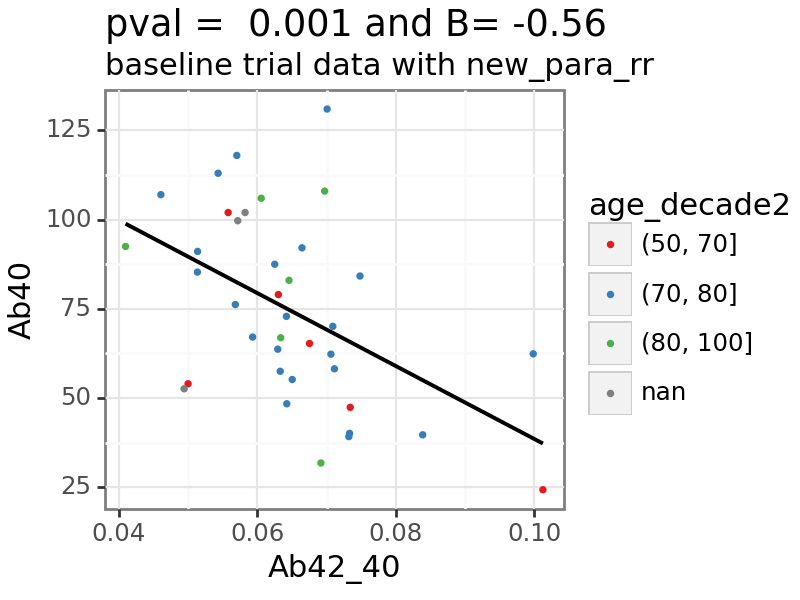

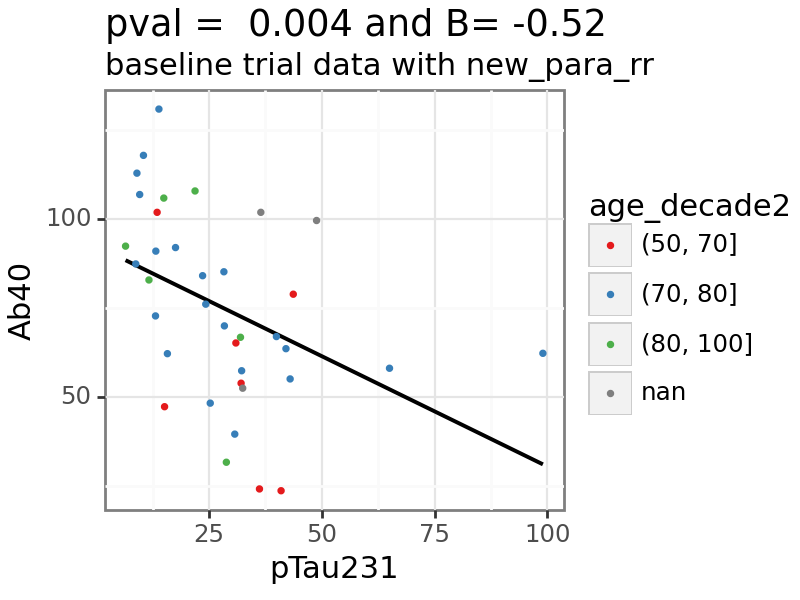

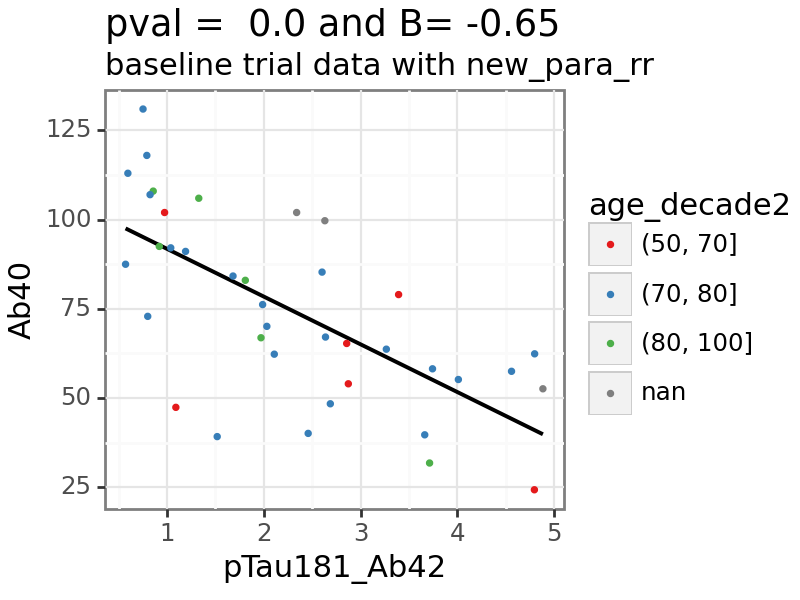

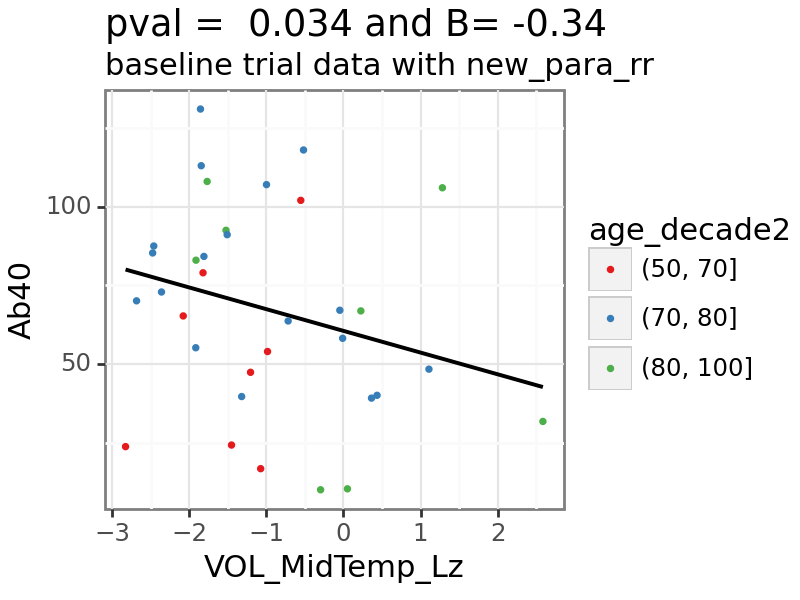

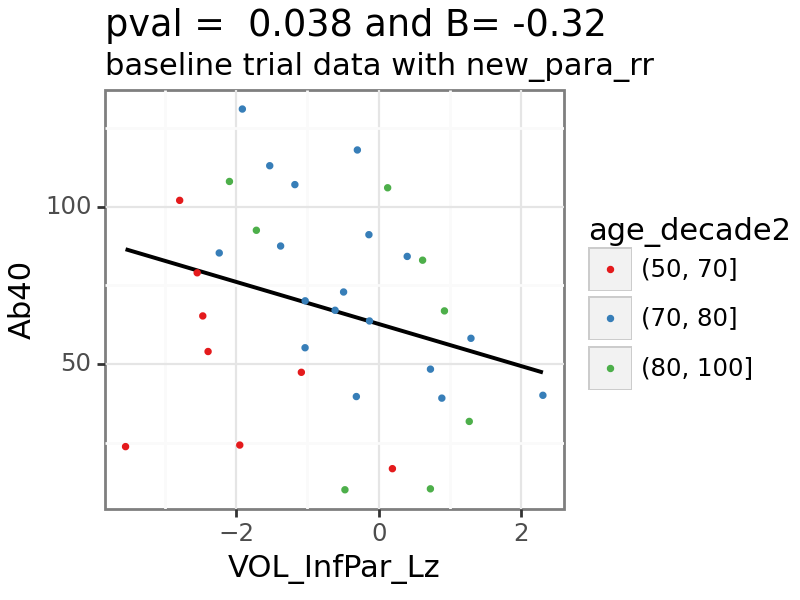

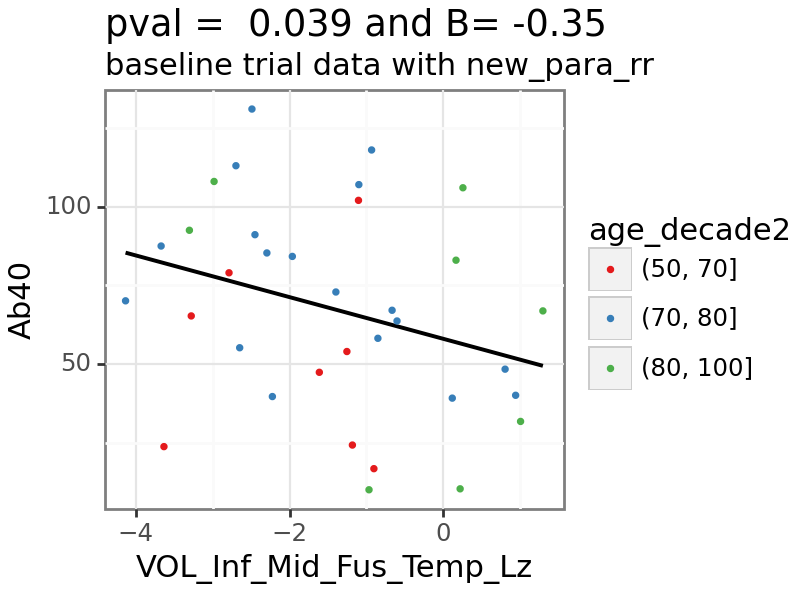

In [44]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['varx'].isin([varx]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'vary']

for vary in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [vary, varx])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = vary, y = varx, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Ab42

In [45]:
varx = 'Ab42'

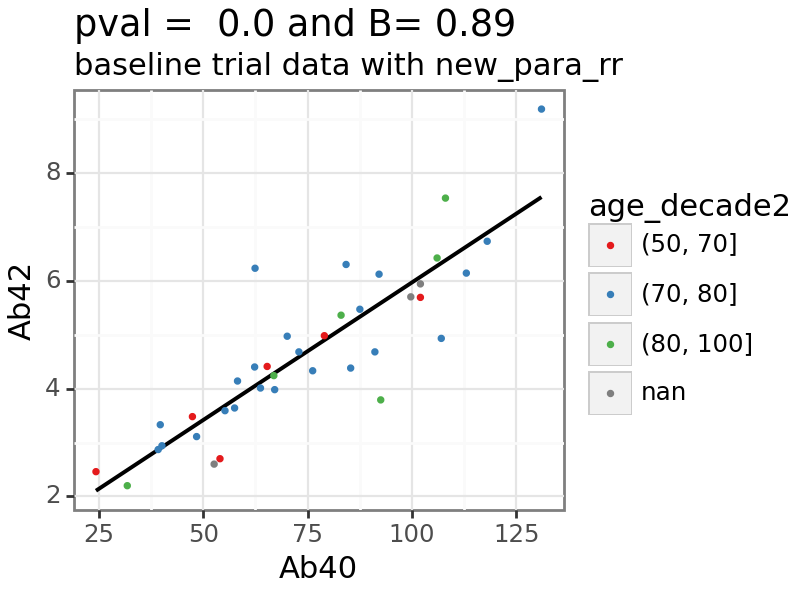

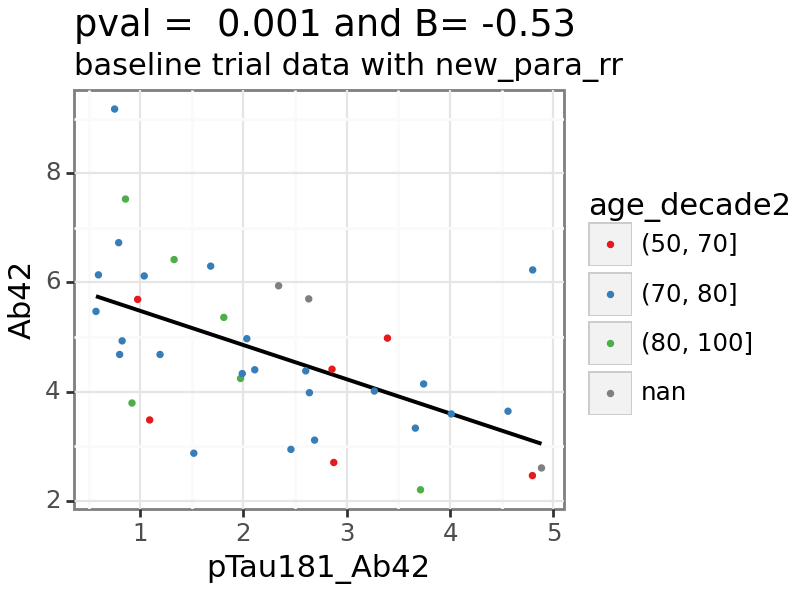

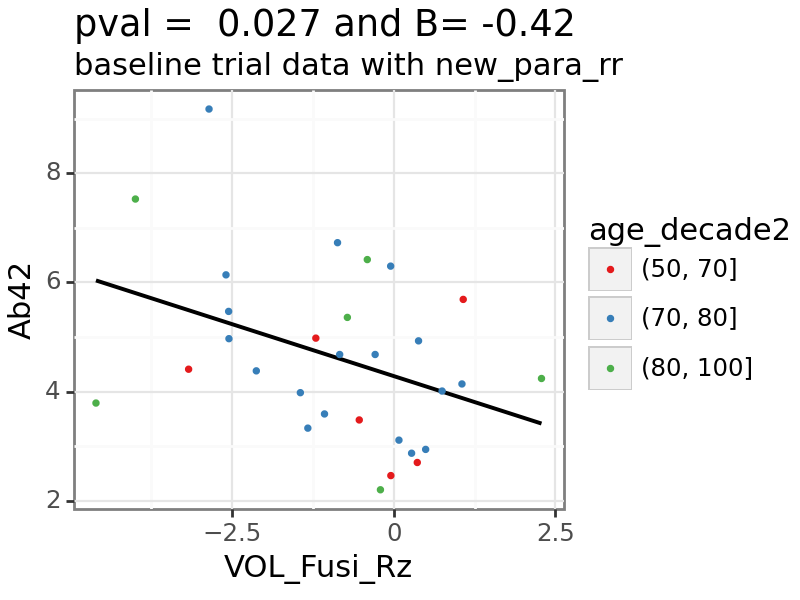

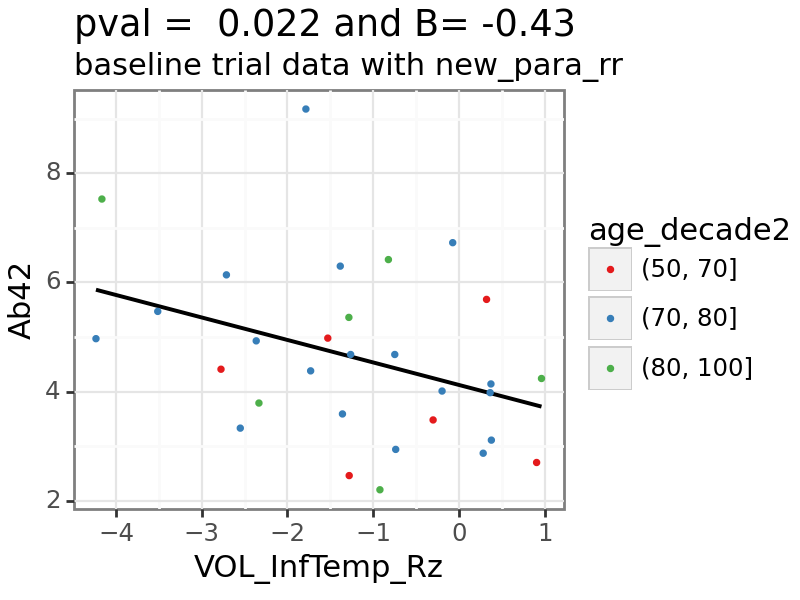

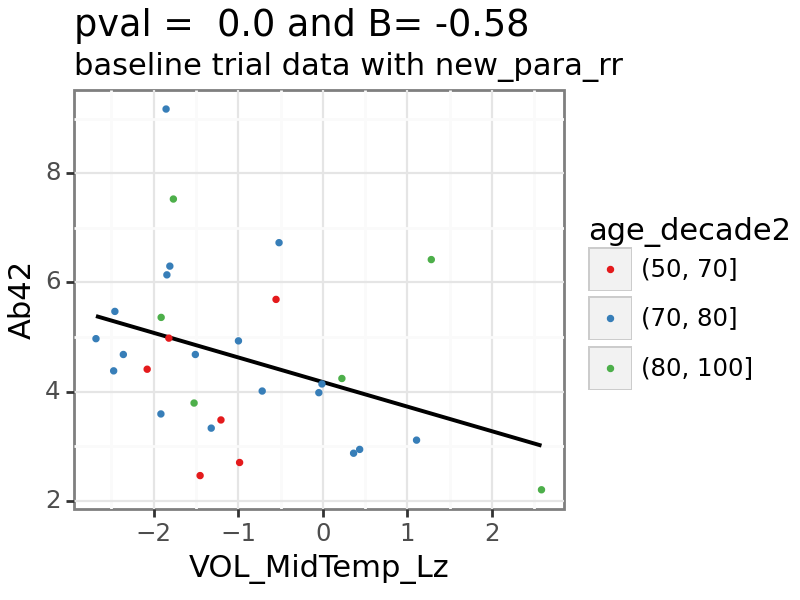

...

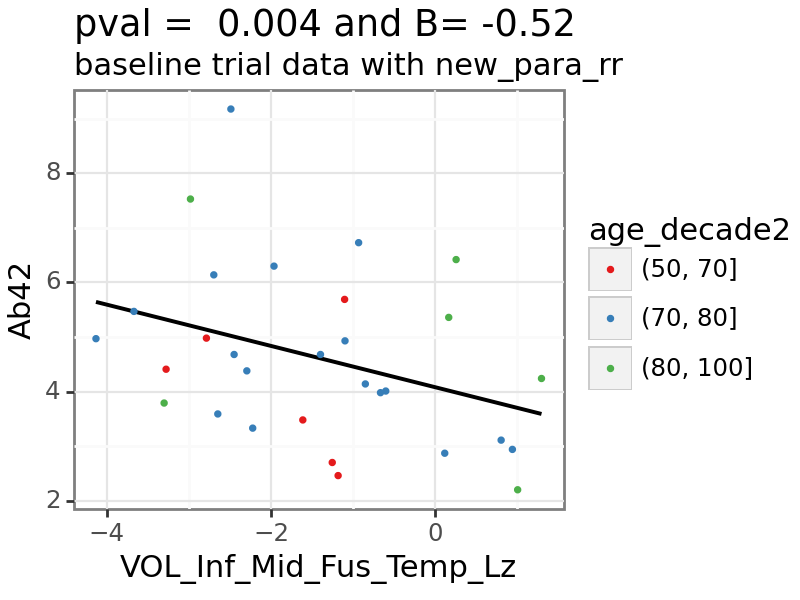

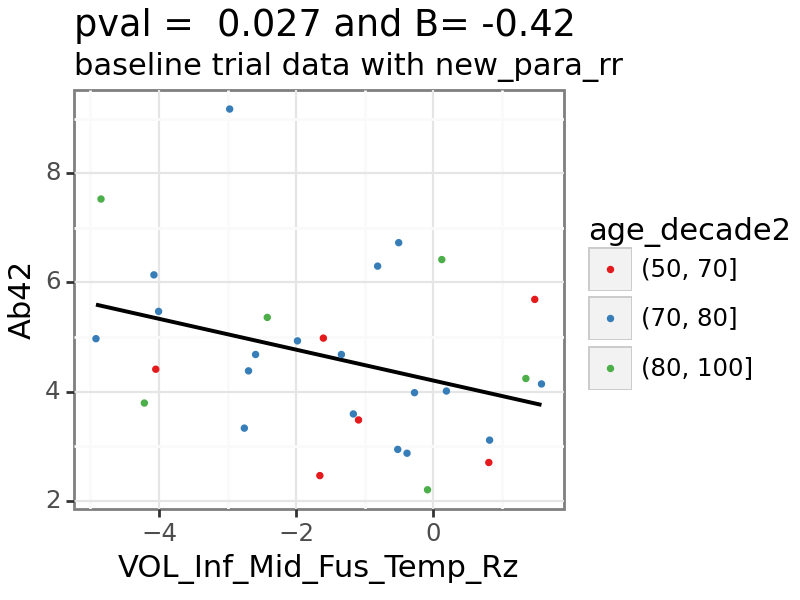

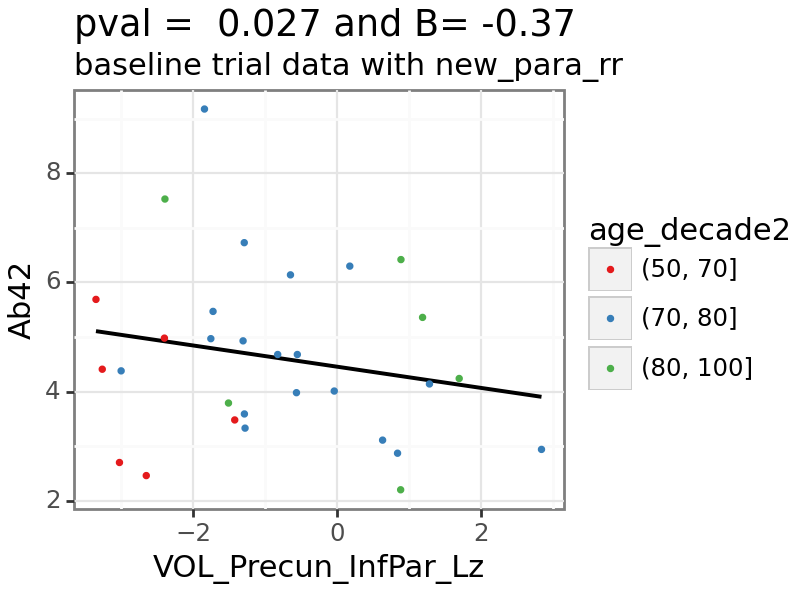

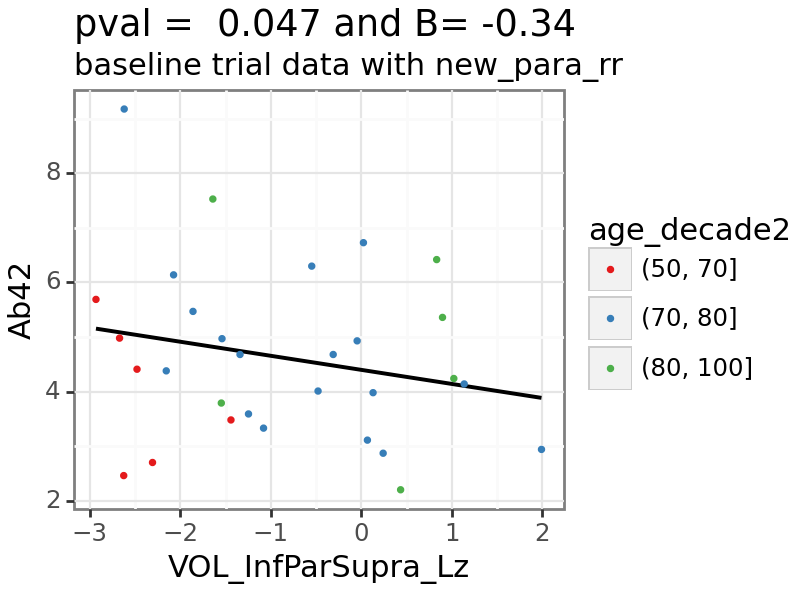

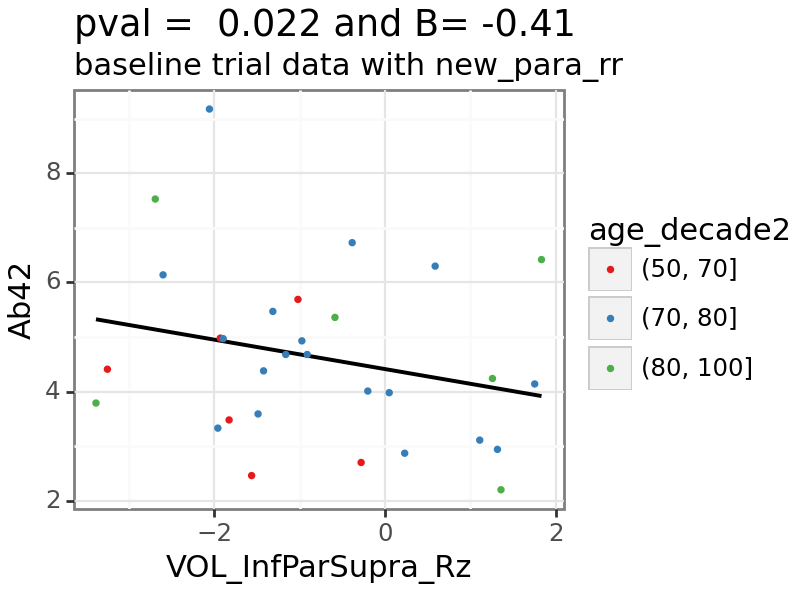

In [46]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['varx'].isin([varx]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'vary']

for vary in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    subset_data = baseline_trial_data.dropna(subset = [vary, varx])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = vary, y = varx, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Ab42_40

In [47]:
varx = 'Ab42_40'

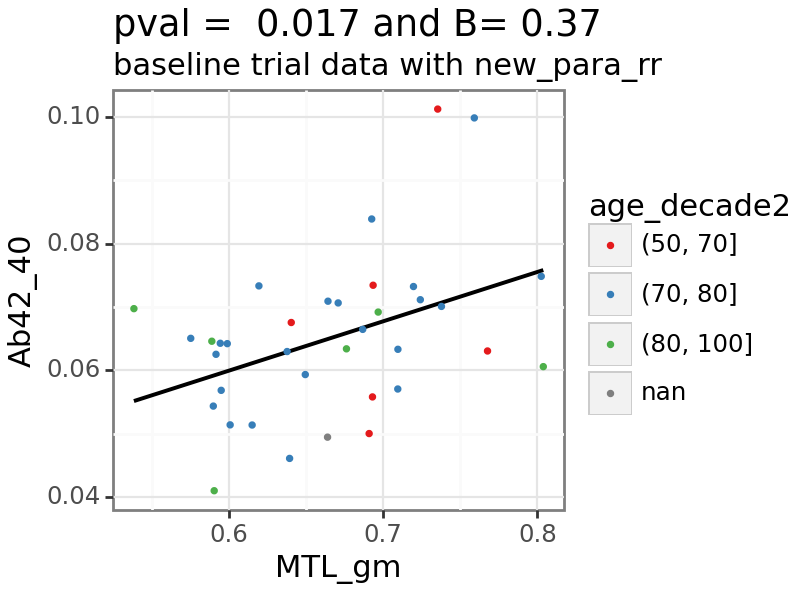

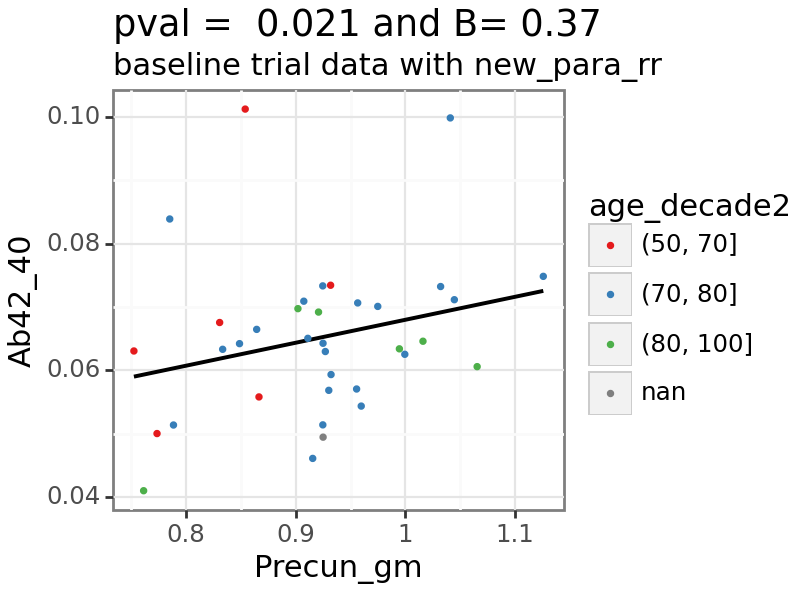

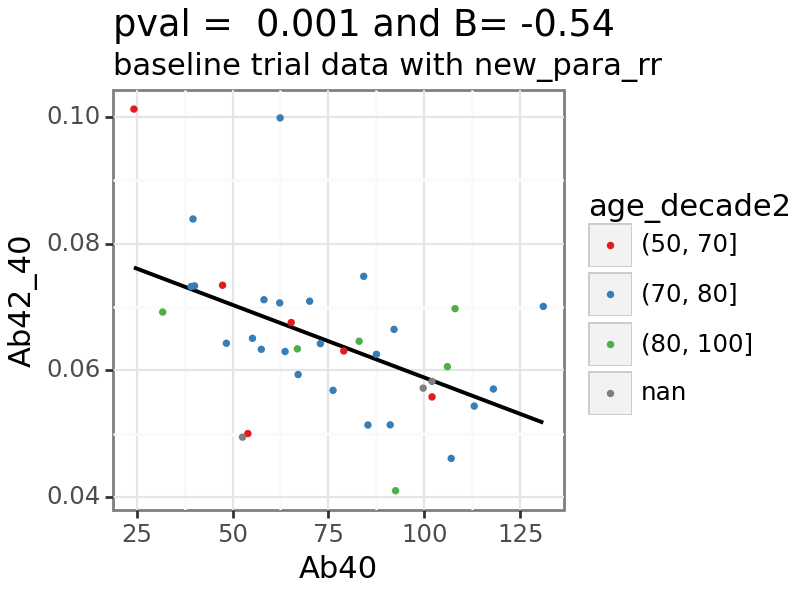

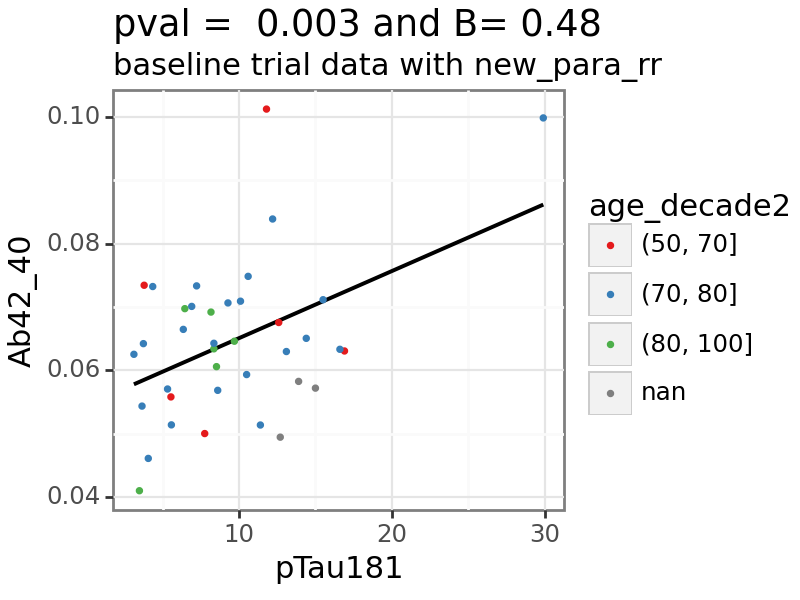

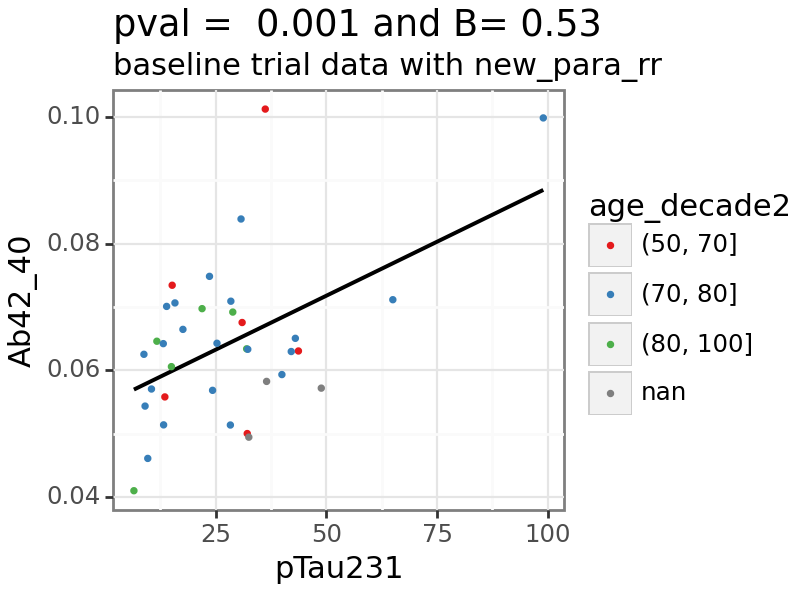

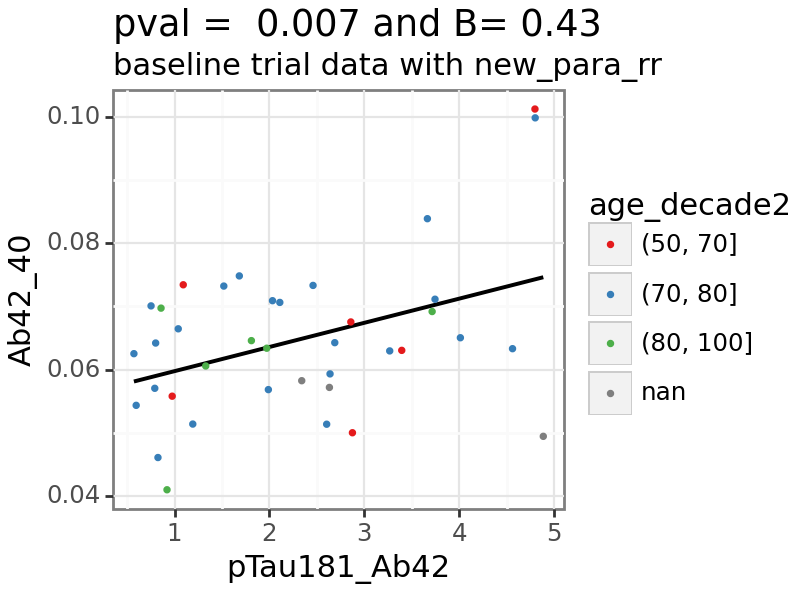

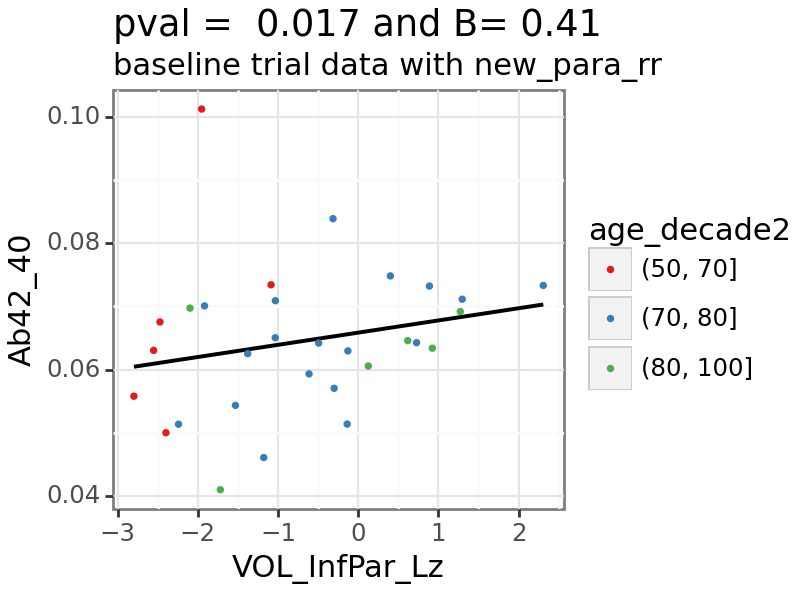

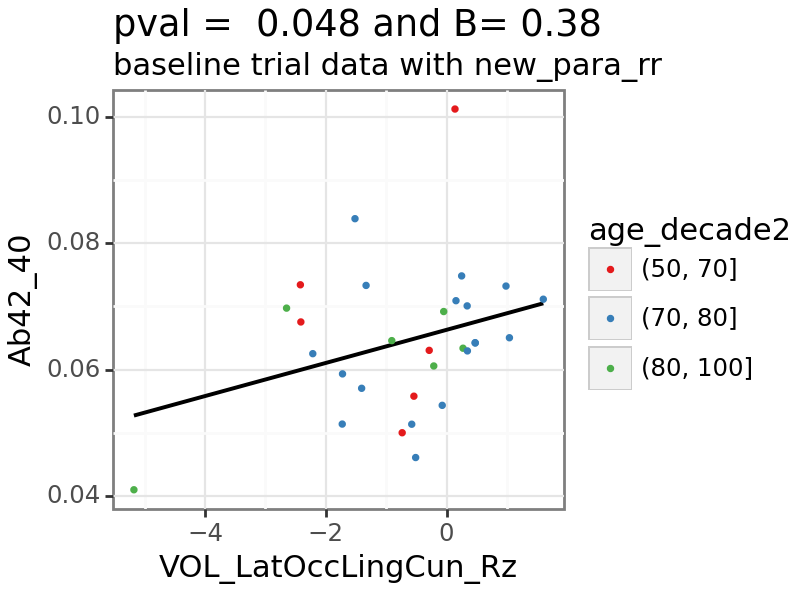

In [48]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['varx'].isin([varx]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'vary']

for vary in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [vary, varx])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = vary, y = varx, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## pTau181


In [49]:
varx = 'pTau181'

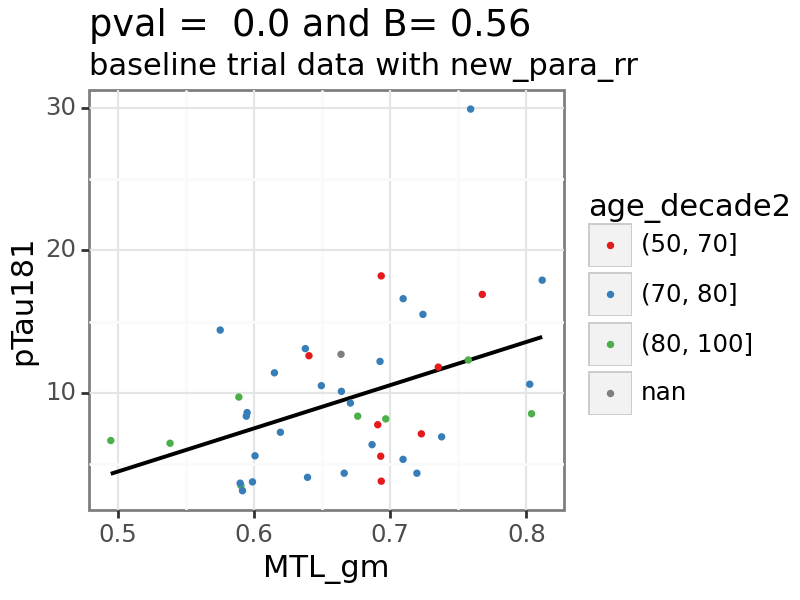

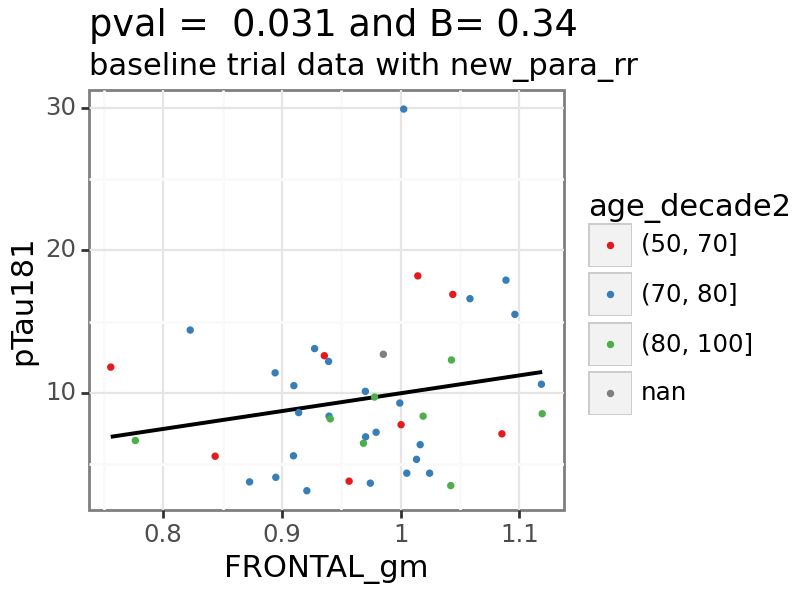

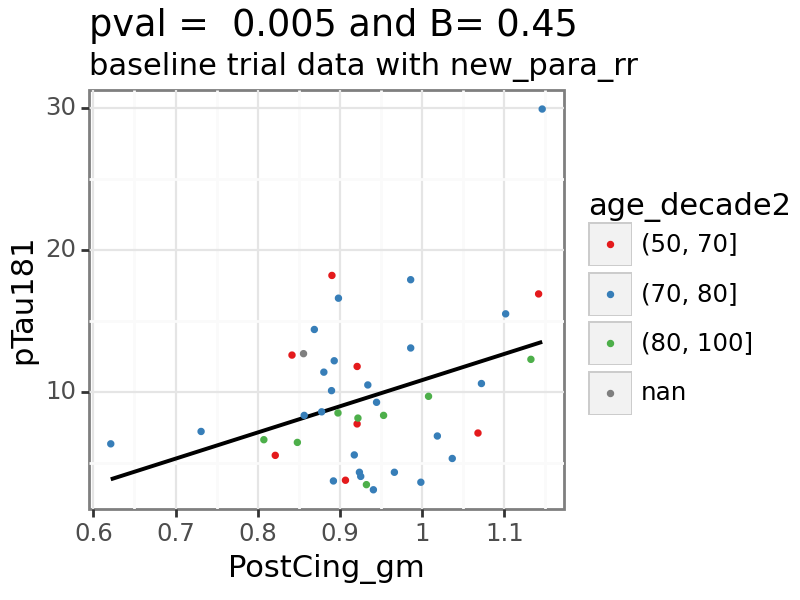

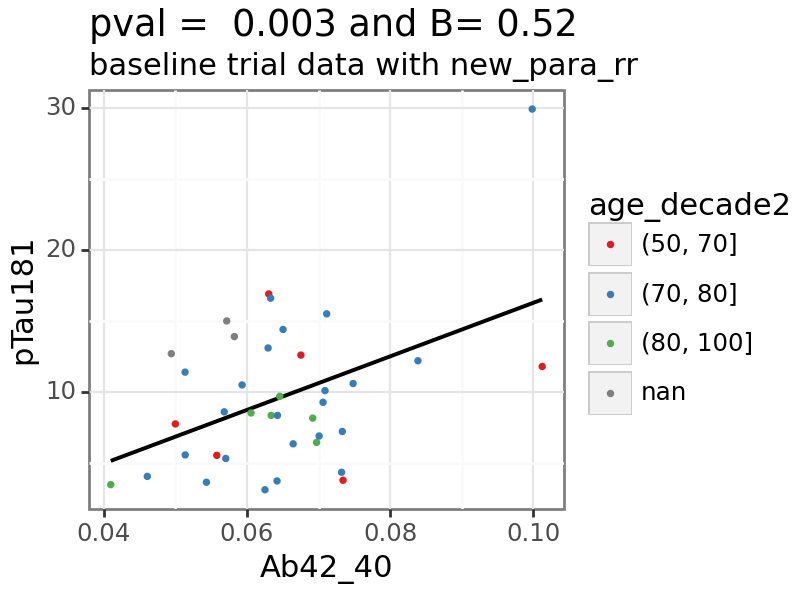

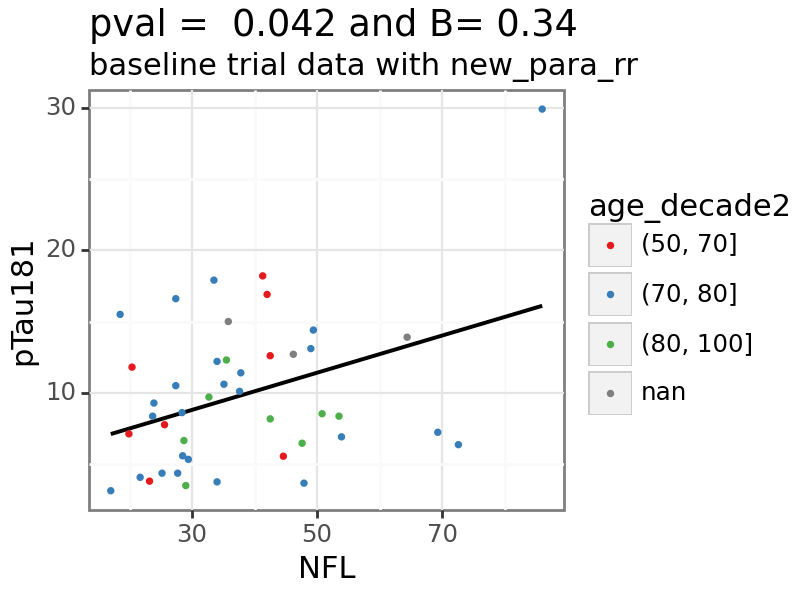

...

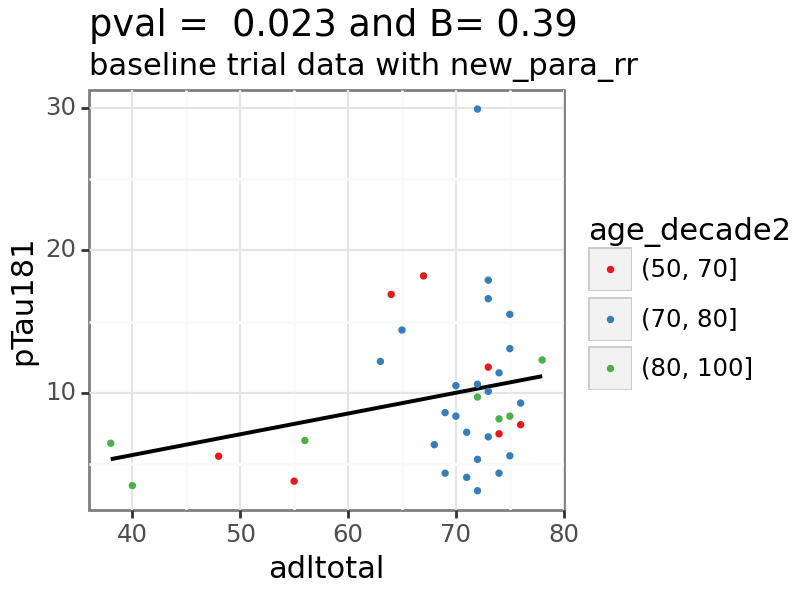

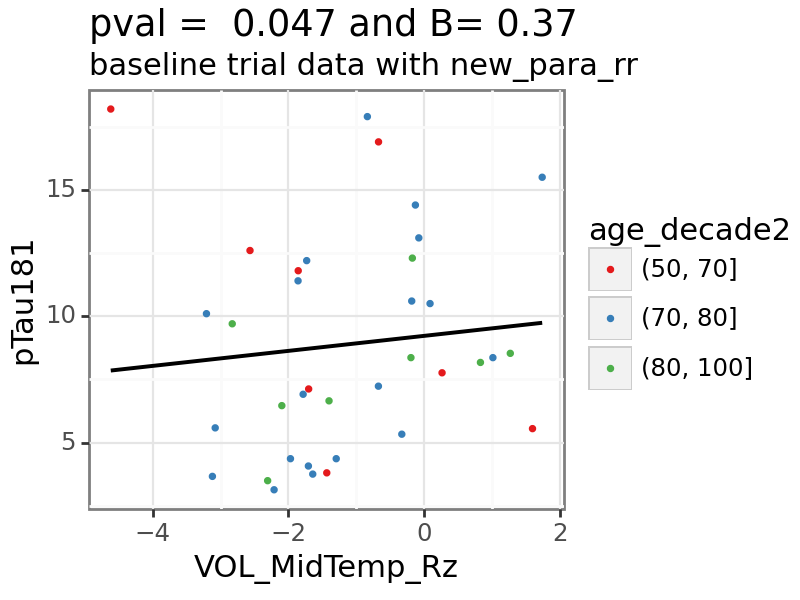

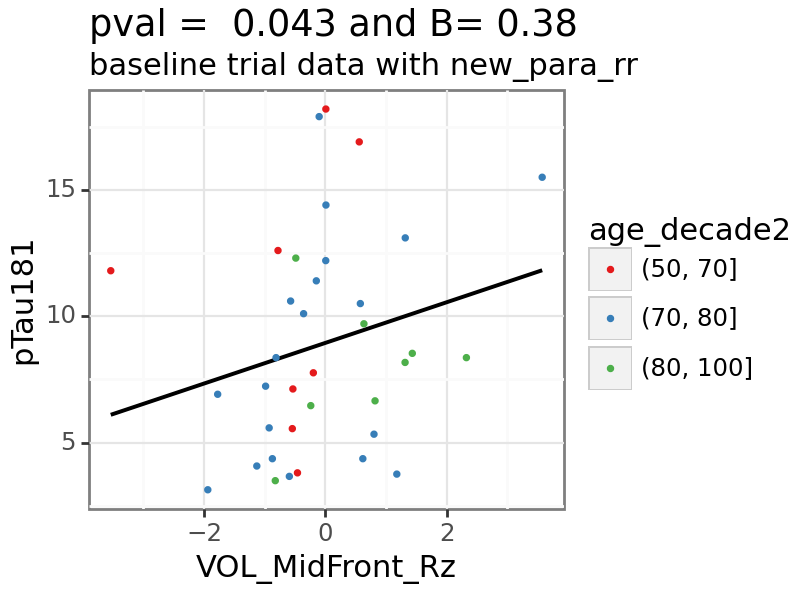

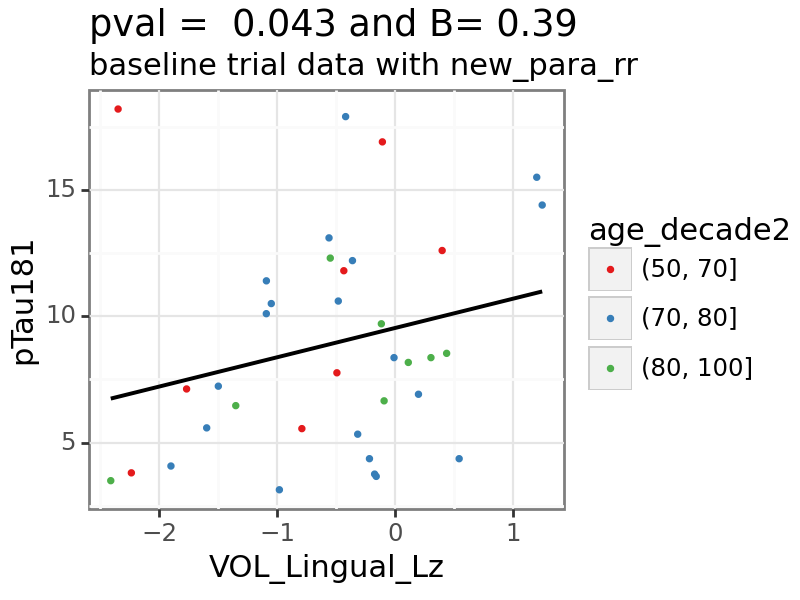

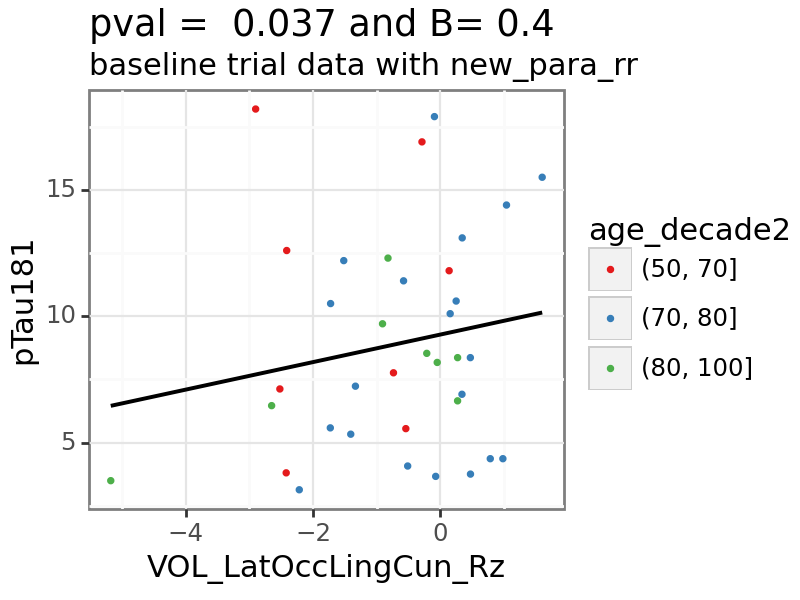

In [50]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['varx'].isin([varx]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'vary']

for vary in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [vary, varx])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = vary, y = varx, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## pTau217

In [51]:
varx = 'pTau217'

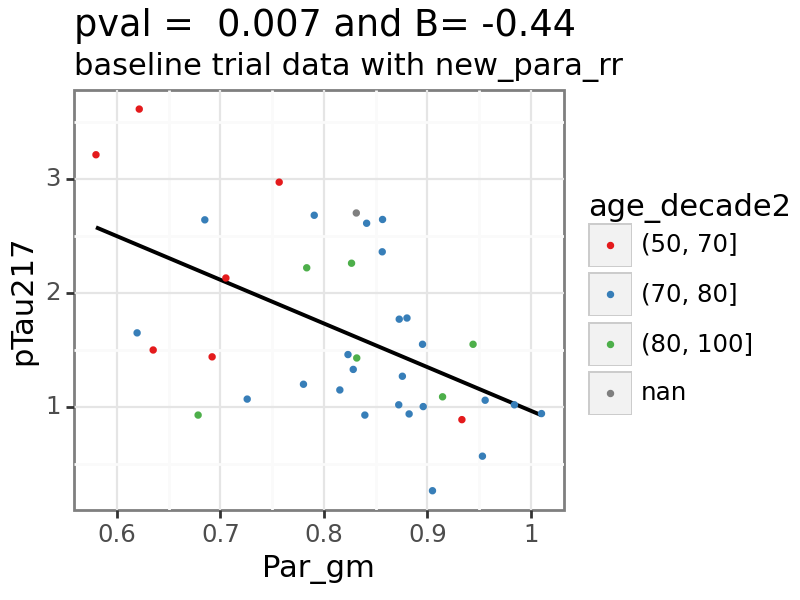

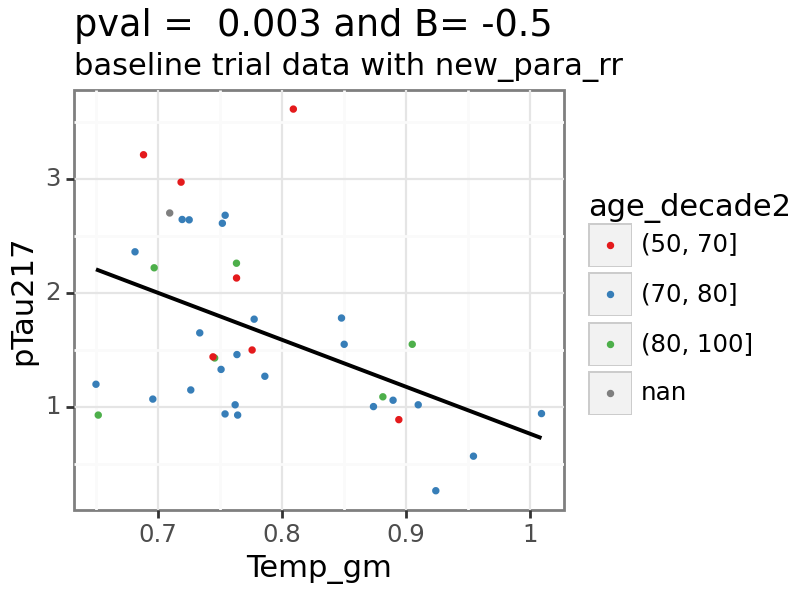

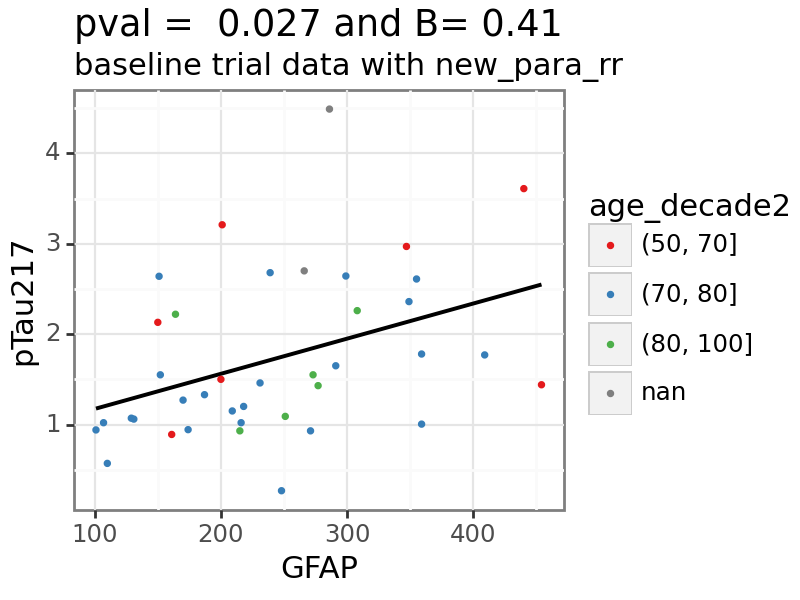

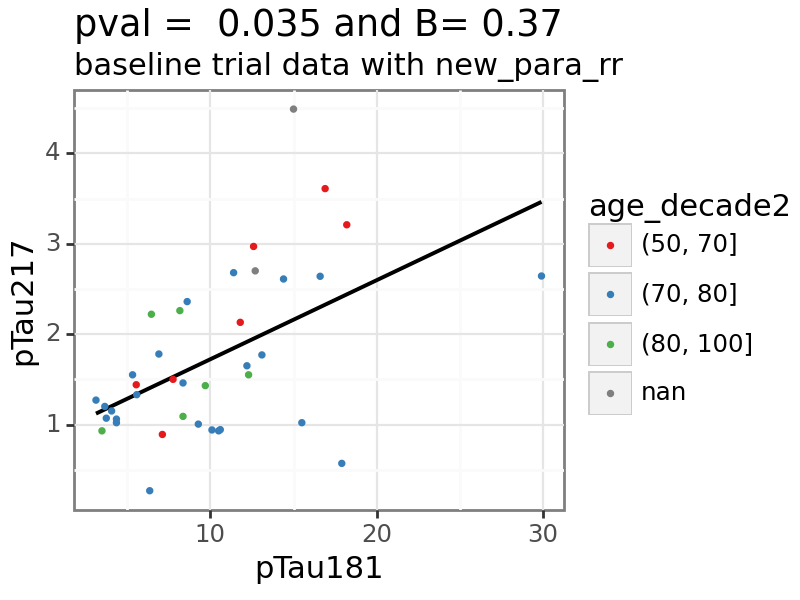

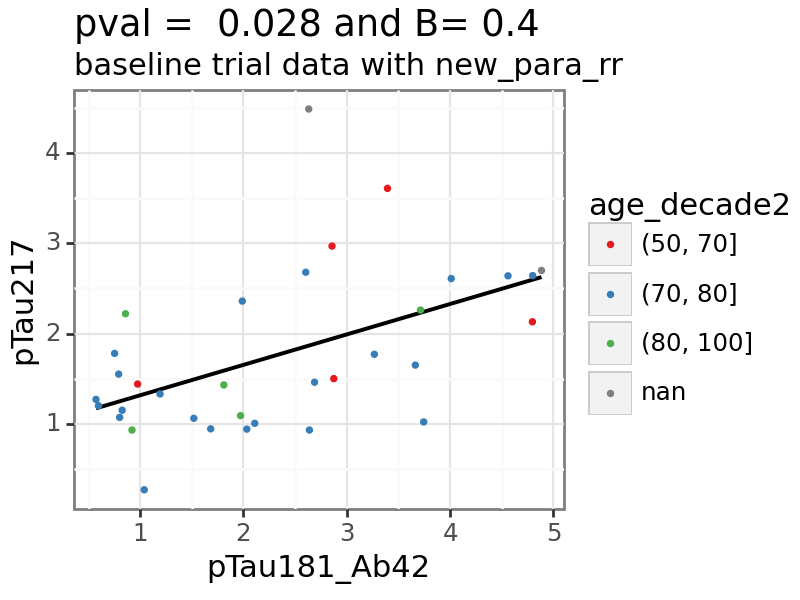

...

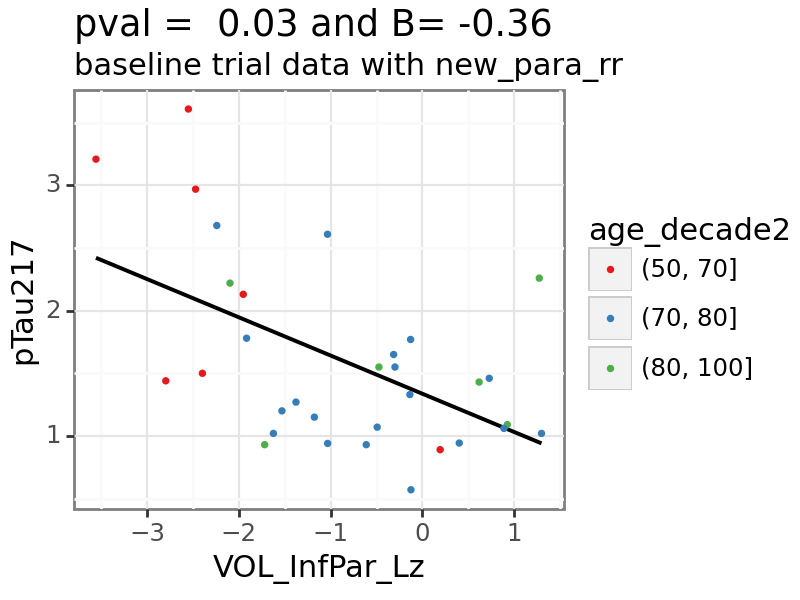

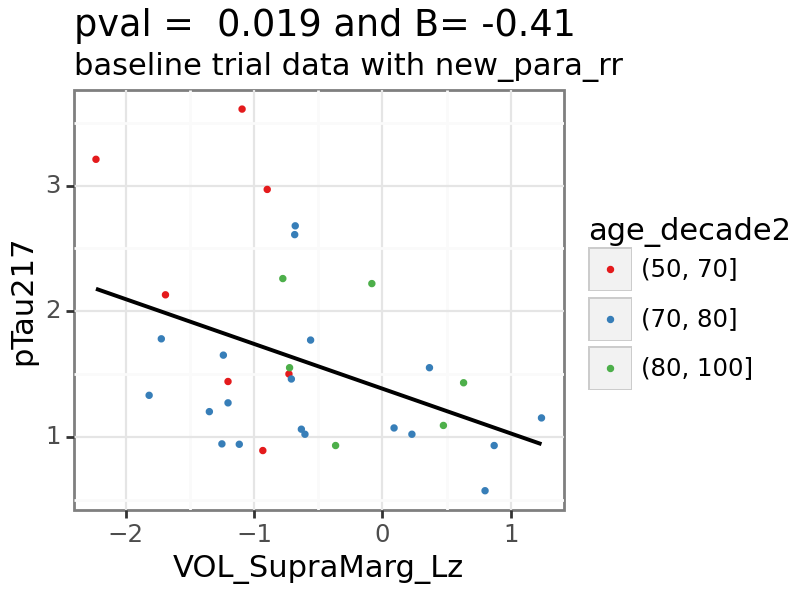

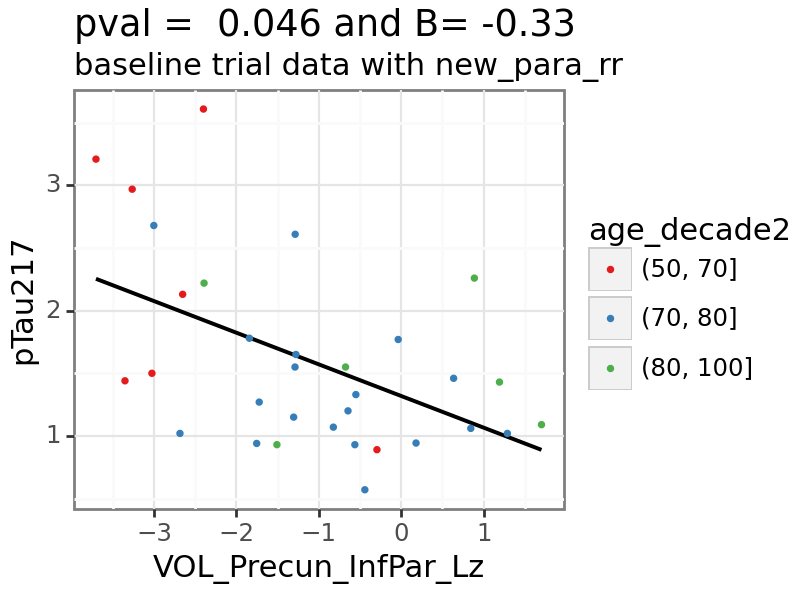

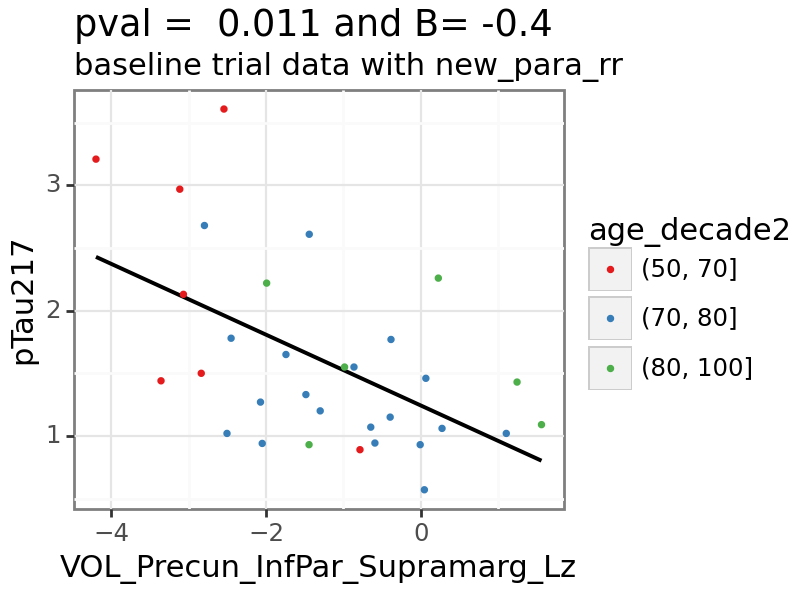

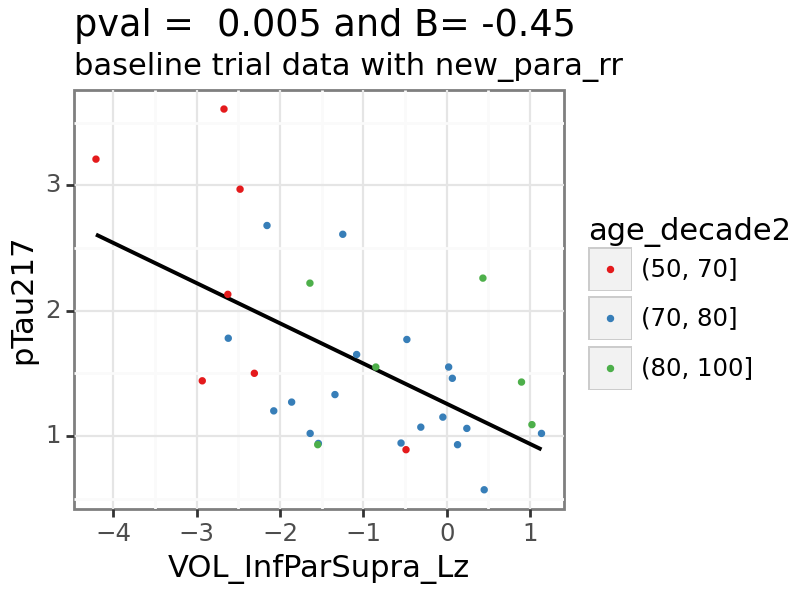

In [52]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['varx'].isin([varx]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'vary']
    
for vary in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [vary, varx])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = vary, y = varx, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## pTau231

In [53]:
varx = 'pTau231'

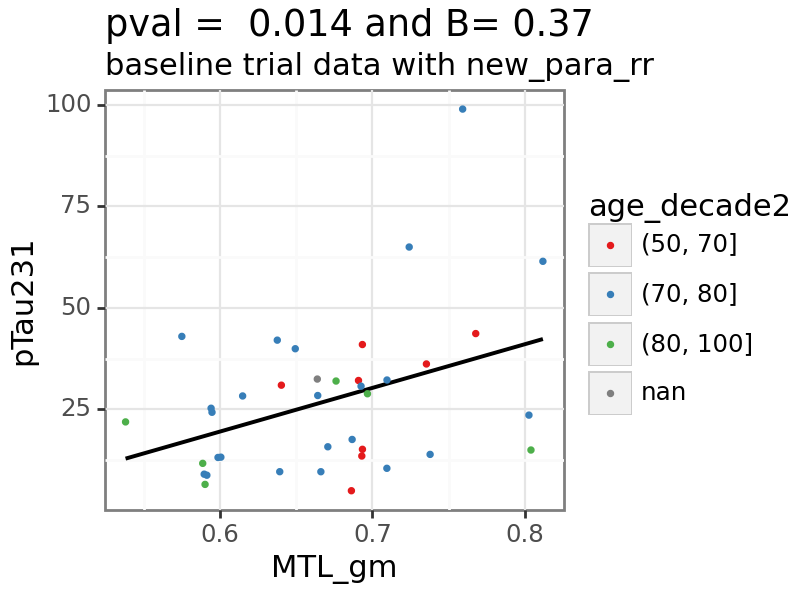

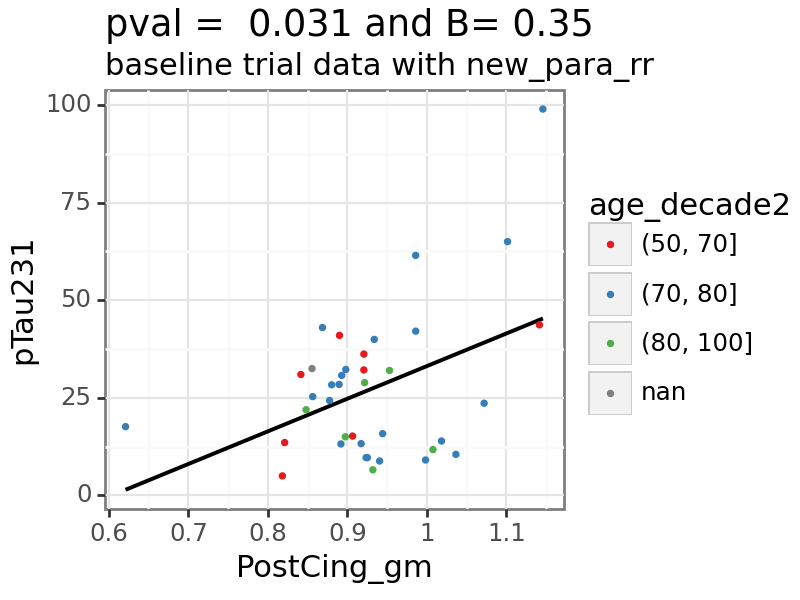

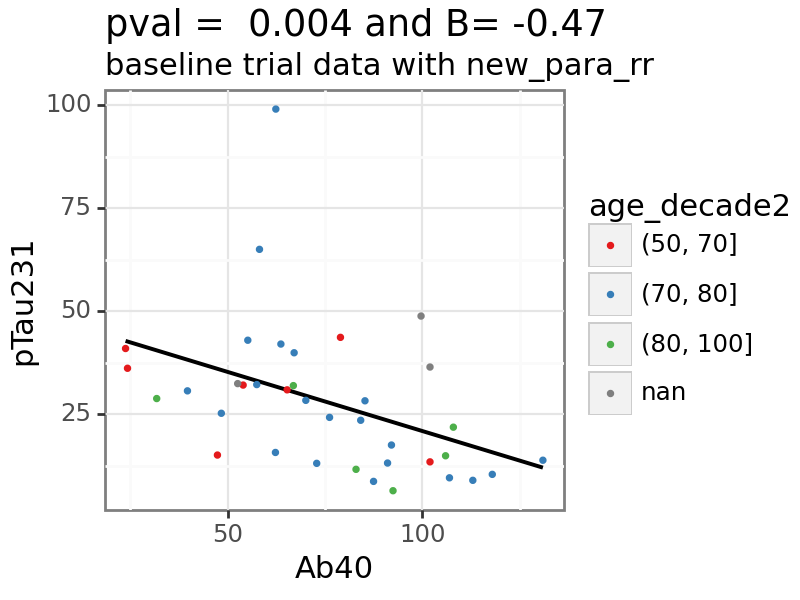

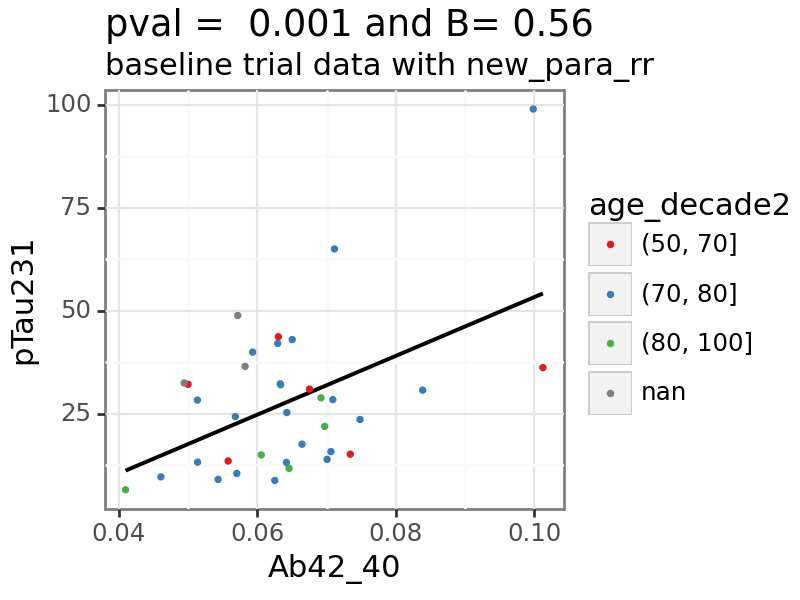

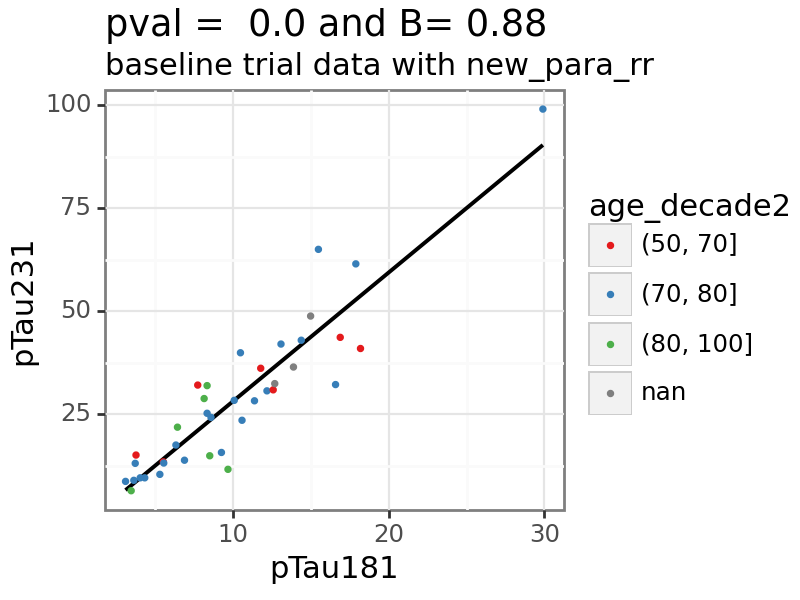

...

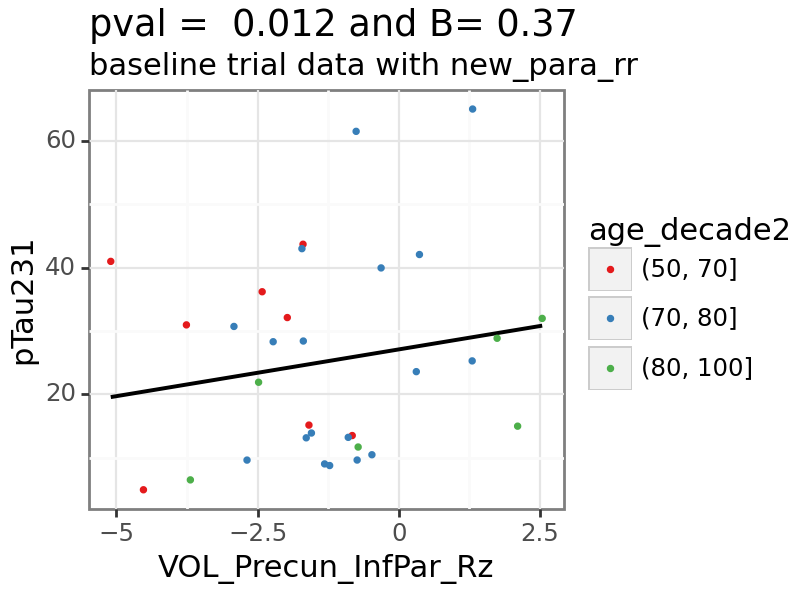

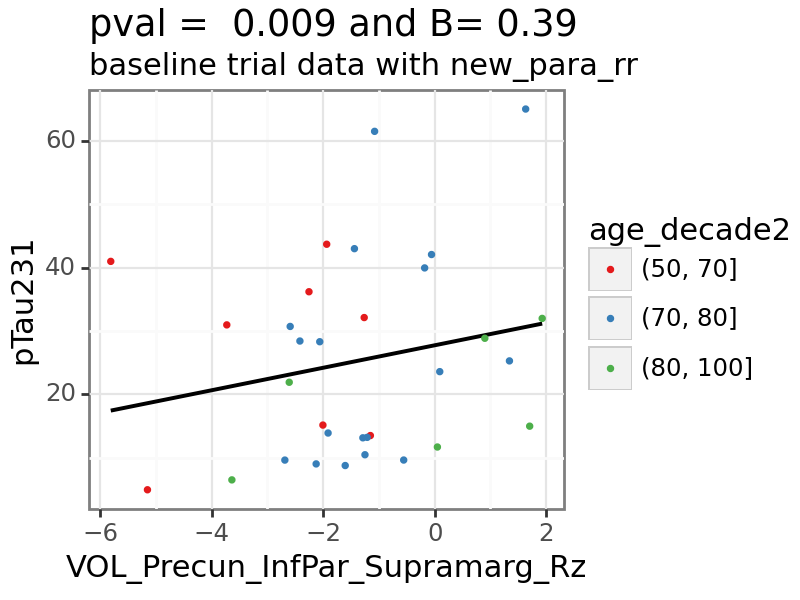

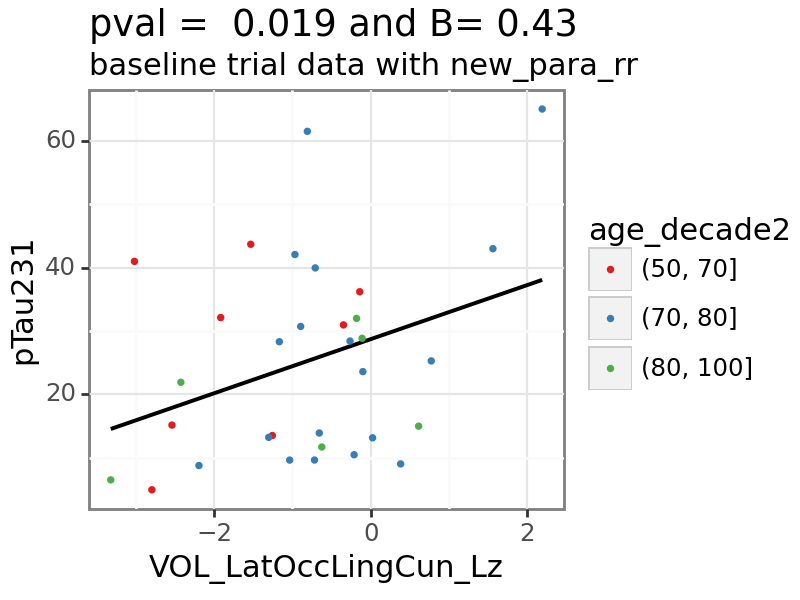

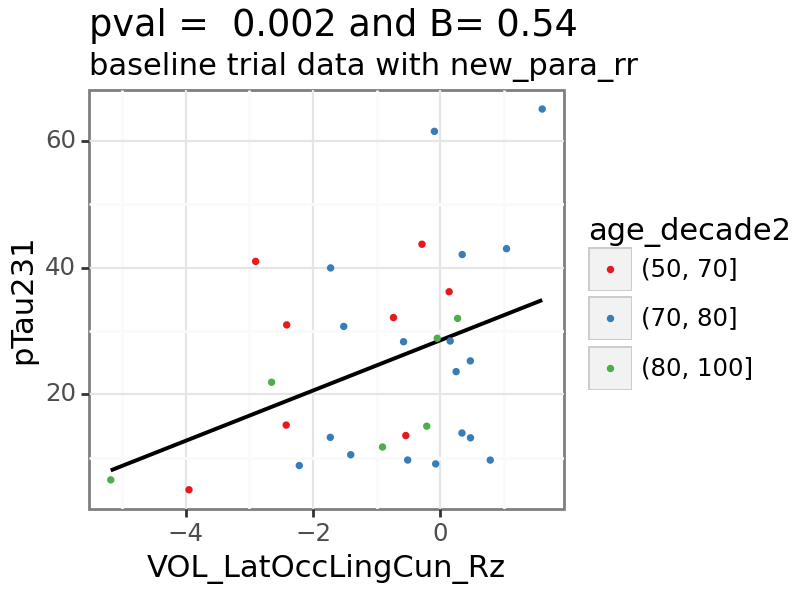

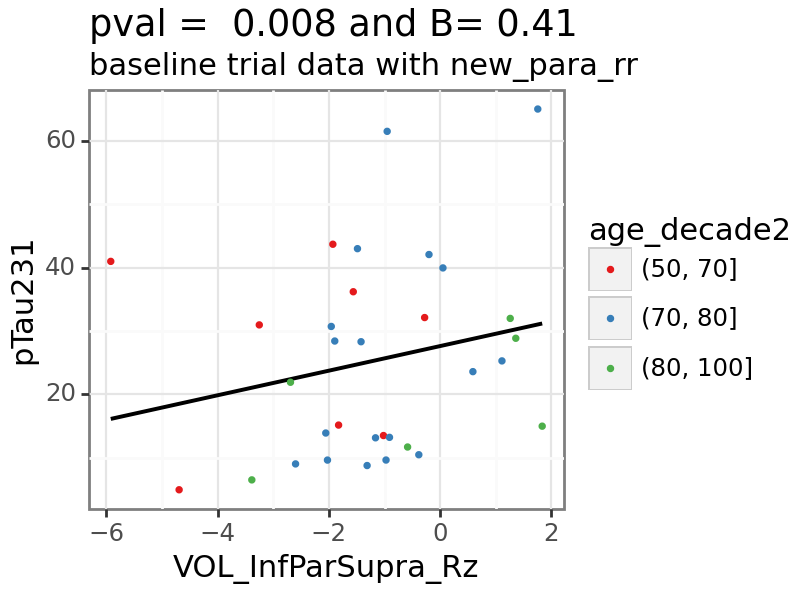

In [54]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['varx'].isin([varx]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'vary']

for vary in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [vary, varx])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = vary, y = varx, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## GFAP

In [55]:
varx = 'GFAP'

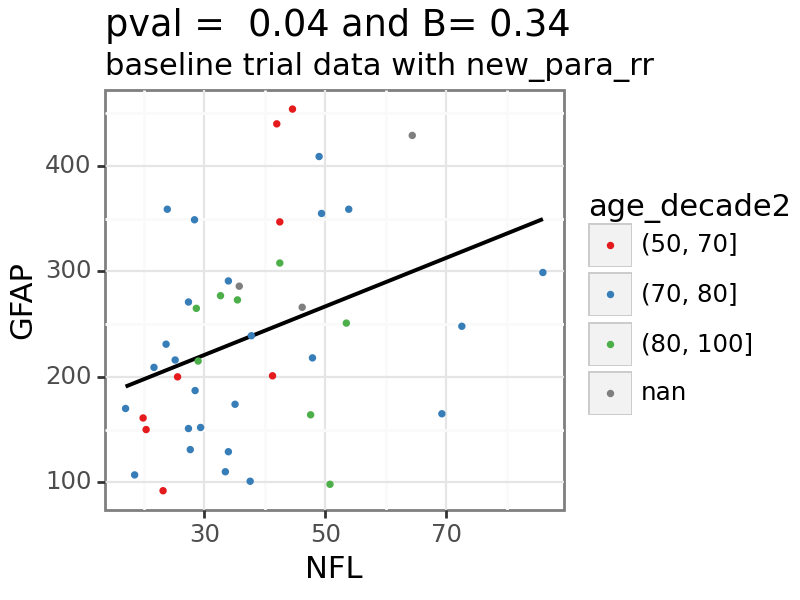

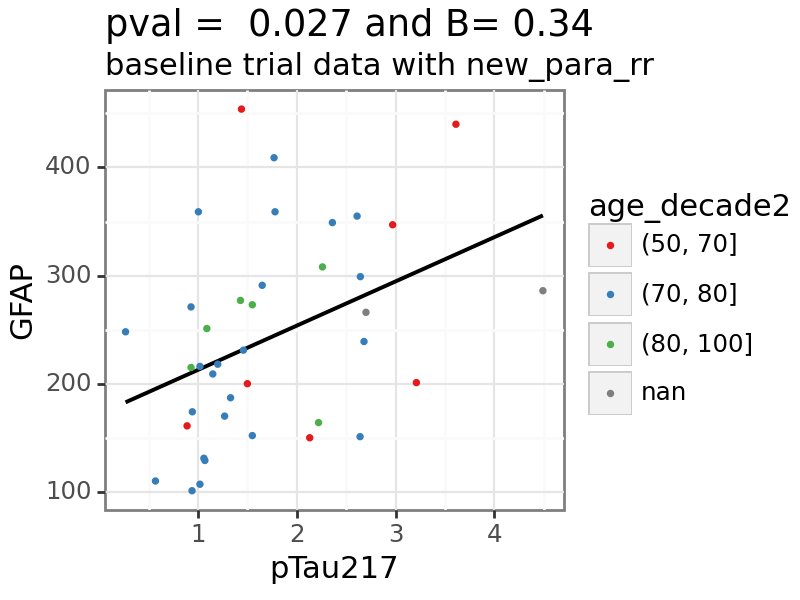

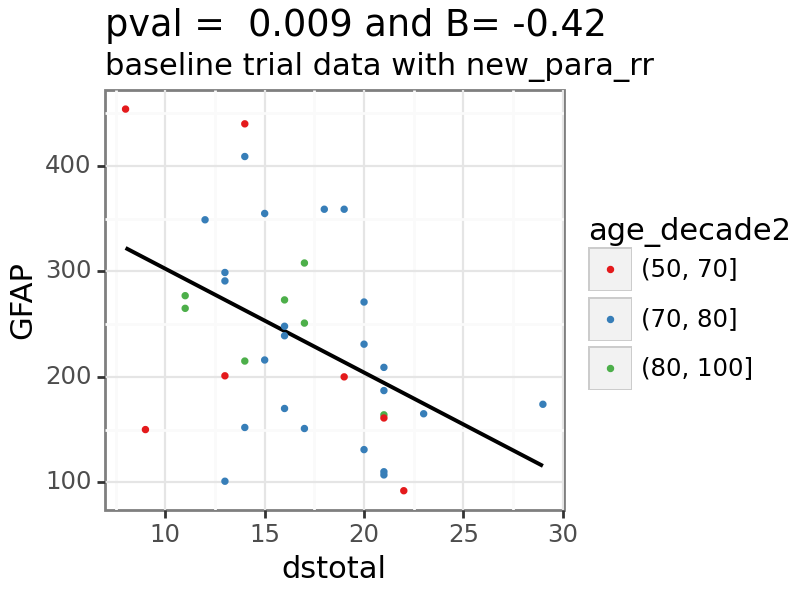

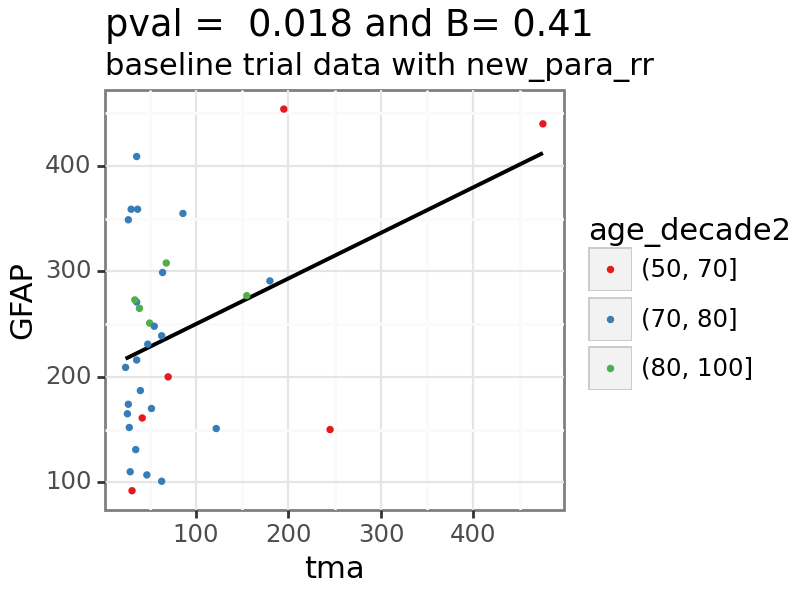

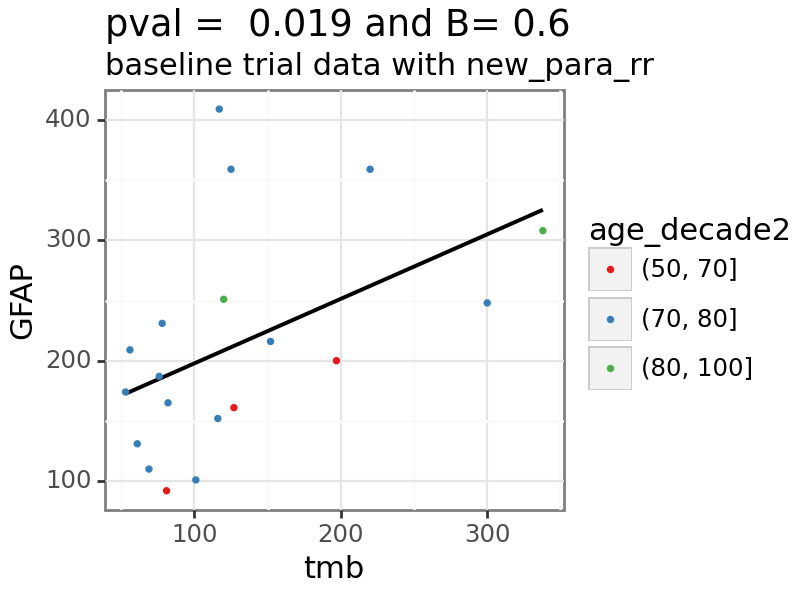

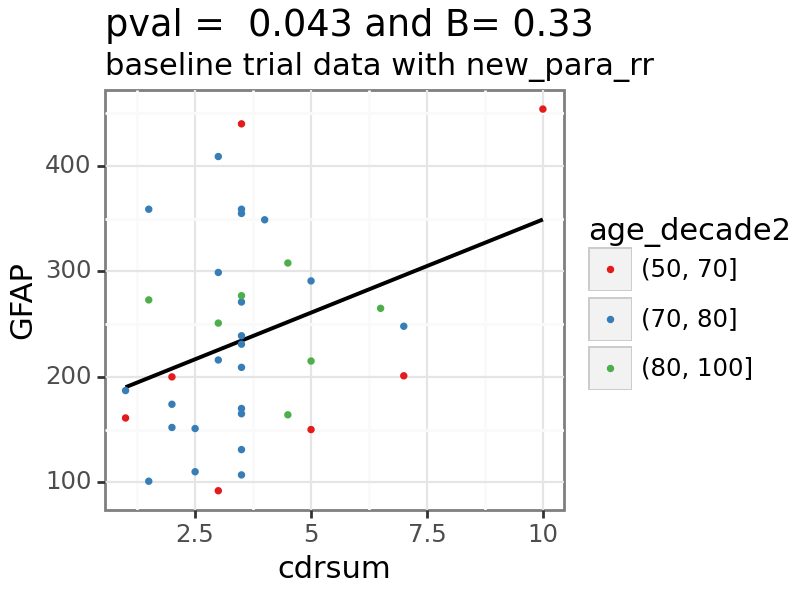

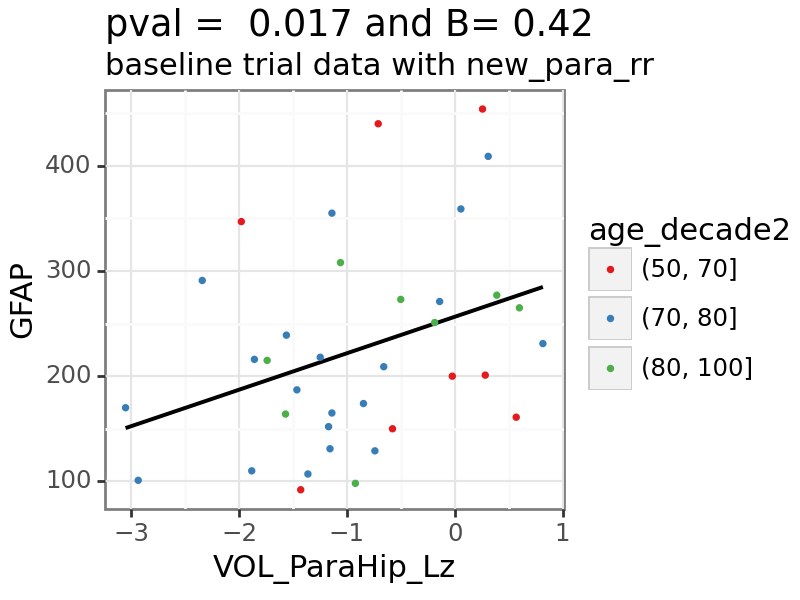

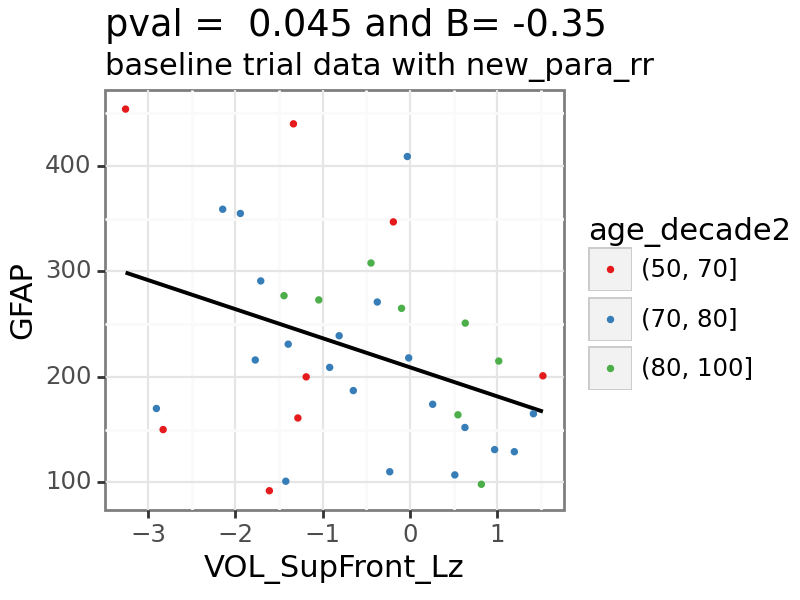

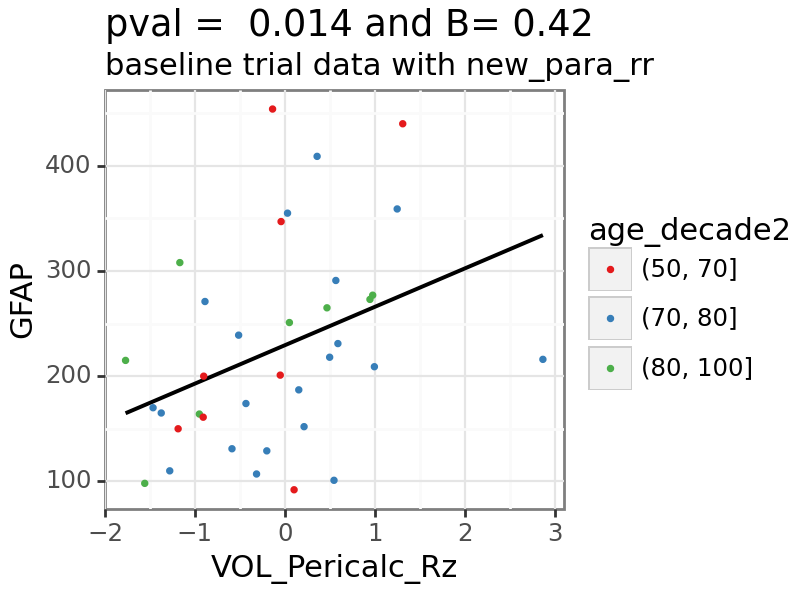

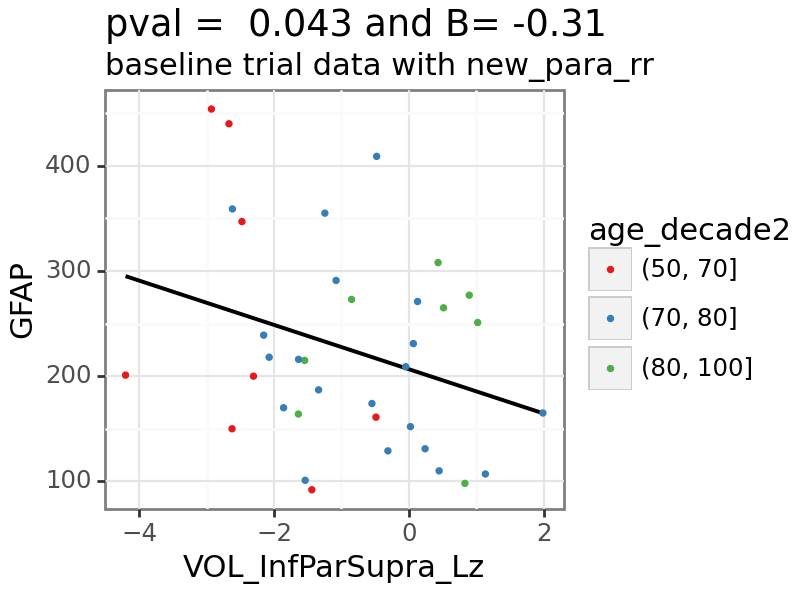

In [56]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['varx'].isin([varx]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'vary']

for vary in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [vary, varx])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = vary, y = varx, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## NFL

In [57]:
varx = 'NFL'

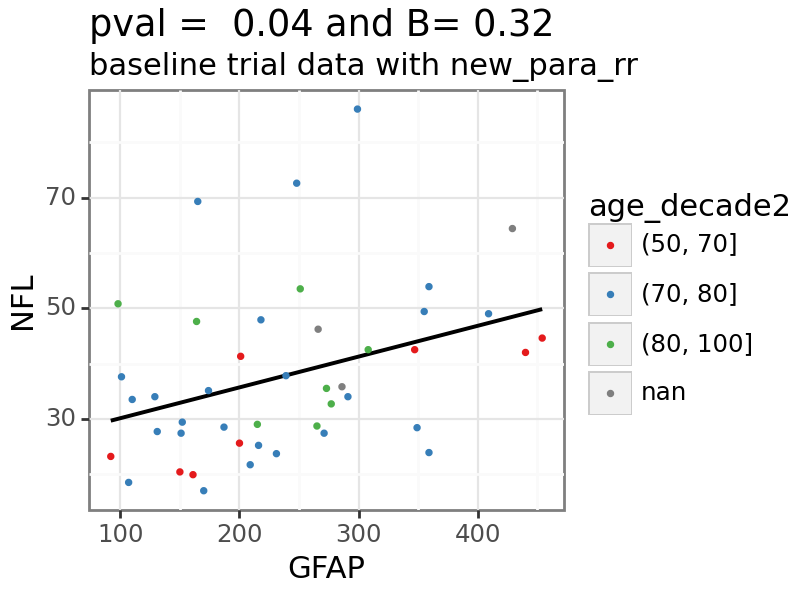

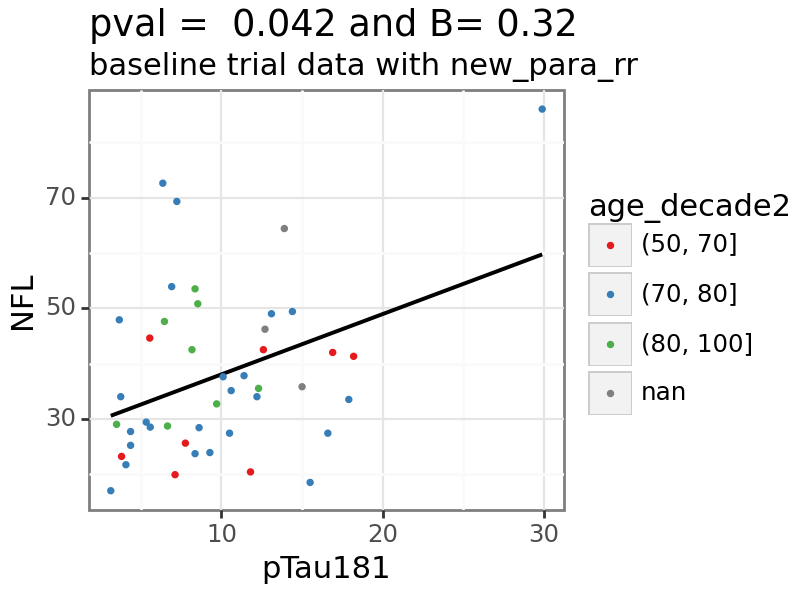

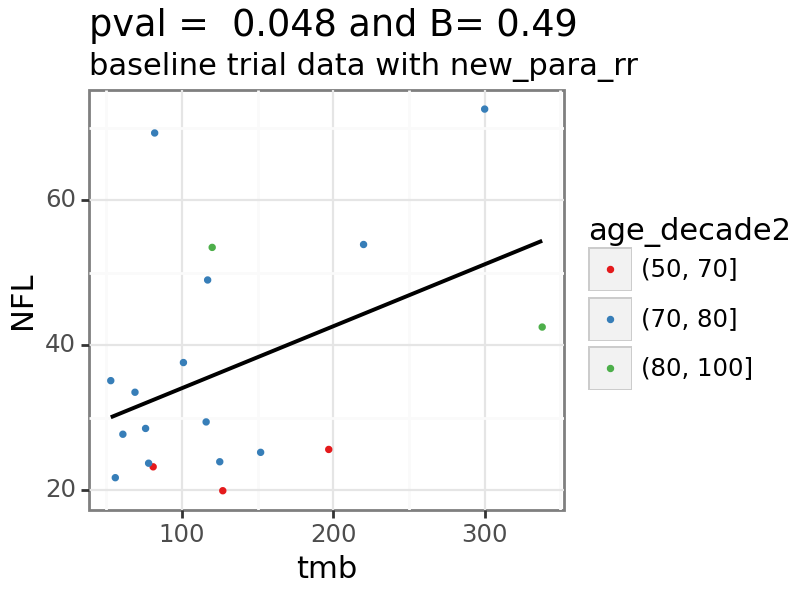

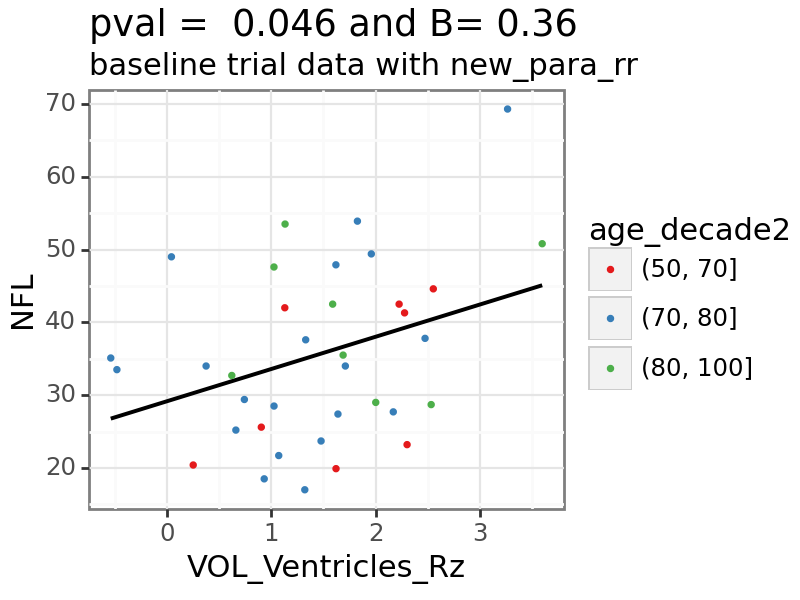

In [58]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['varx'].isin([varx]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'vary']
    
for vary in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [vary, varx])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = vary, y = varx, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## pTau181_Ab42_40

In [59]:
varx = 'pTau181_Ab42_40'

In [60]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['varx'].isin([varx]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'vary']


for vary in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [vary, varx])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = vary, y = varx, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

# Plot reverse direction relationships split by other factors

In [61]:
baseline_trial_data['MMSE_bin'] = pd.qcut(baseline_trial_data['MMSE'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['cdrsum_bin'] = pd.qcut(baseline_trial_data['cdrsum'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['Ab42_40_log10_bin'] = pd.qcut(baseline_trial_data['Ab42_40_log10'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['pTau217_log10_bin'] = pd.qcut(baseline_trial_data['pTau217_log10'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['GFAP_log10_bin'] = pd.qcut(baseline_trial_data['GFAP_log10'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['NFL_log10_bin'] = pd.qcut(baseline_trial_data['NFL_log10'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['VOL_Hip_Rz_bin'] = pd.qcut(baseline_trial_data['VOL_Hip_Rz'], [0, .33, .66, 1.], precision = 2).astype('str')

C:\Users\Lauren.Koenig\AppData\Local\Temp\8\ipykernel_39240\4187745018.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Lauren.Koenig\AppData\Local\Temp\8\ipykernel_39240\4187745018.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Lauren.Koenig\AppData\Local\Temp\8\ipykernel_39240\4187745018.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:

## Age decade 2

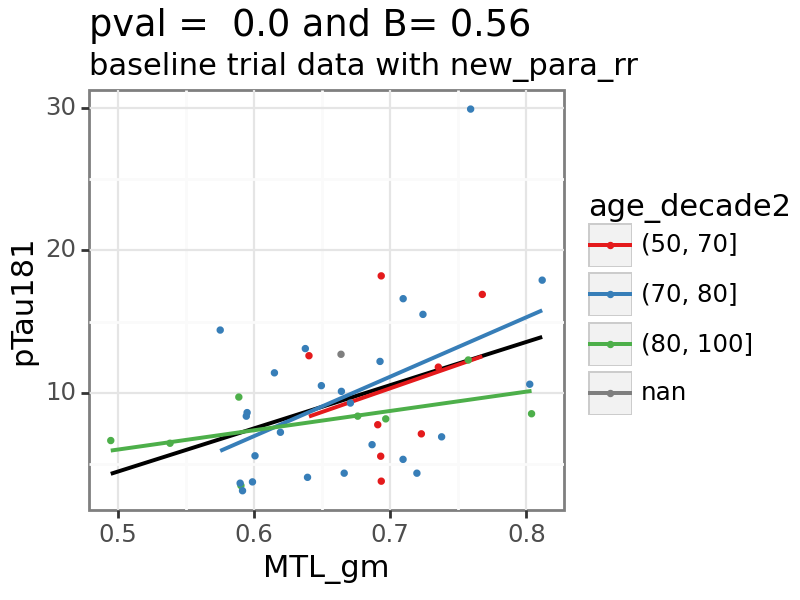

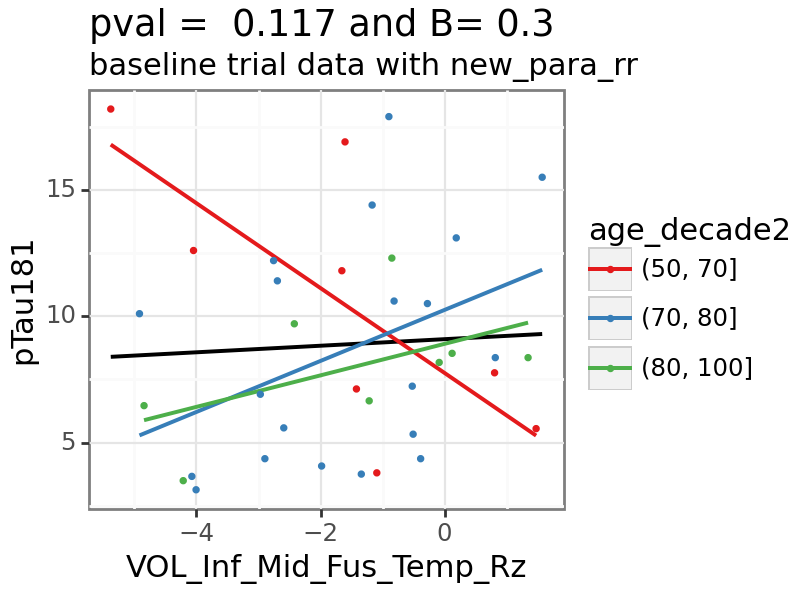

In [62]:
varx = 'pTau181'
p9.options.figure_size = (4,3)  

for vary in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    subset_data = baseline_trial_data.dropna(subset = [vary, varx])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = vary, y = varx, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## CDR sum of boxes

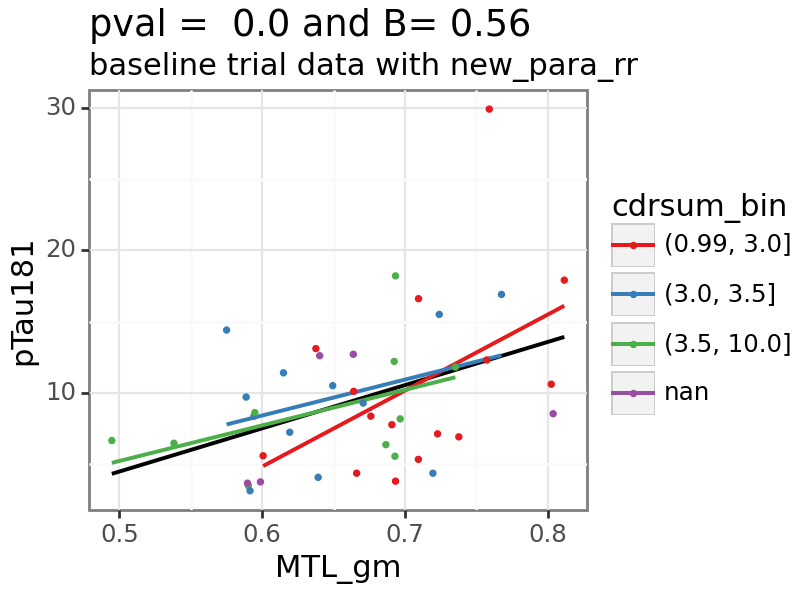

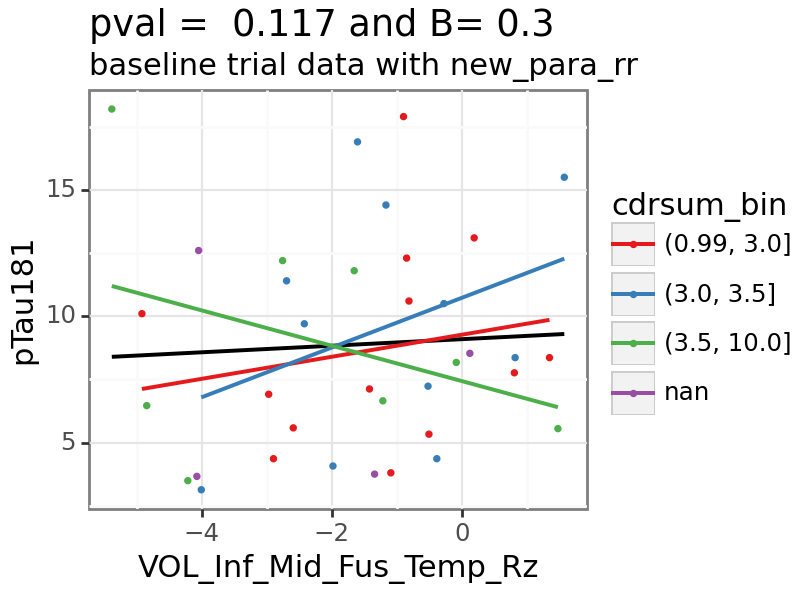

In [63]:
varx = 'pTau181'
p9.options.figure_size = (4,3)  

for vary in [ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [vary, varx])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('cdrsum_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = vary, y = varx, color = 'cdrsum_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## CDR 

C:\Users\Lauren.Koenig\AppData\Local\Temp\8\ipykernel_39240\754229122.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


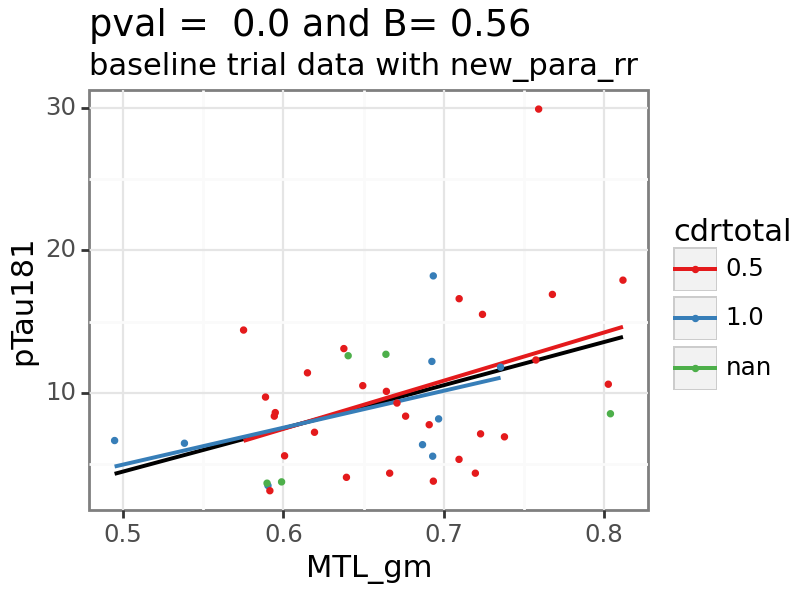

C:\Users\Lauren.Koenig\AppData\Local\Temp\8\ipykernel_39240\754229122.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


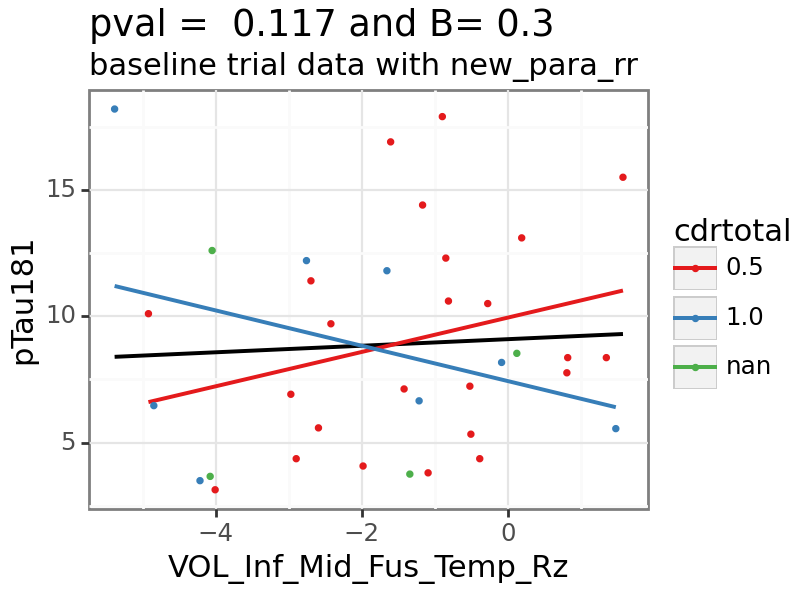

In [64]:
varx = 'pTau181'
p9.options.figure_size = (4,3)  

for vary in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [vary, varx])
    subset_data['cdrtotal'] = subset_data['cdrtotal'].astype('str')
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('cdrtotal', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = vary, y = varx, color = 'cdrtotal'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## MMSE

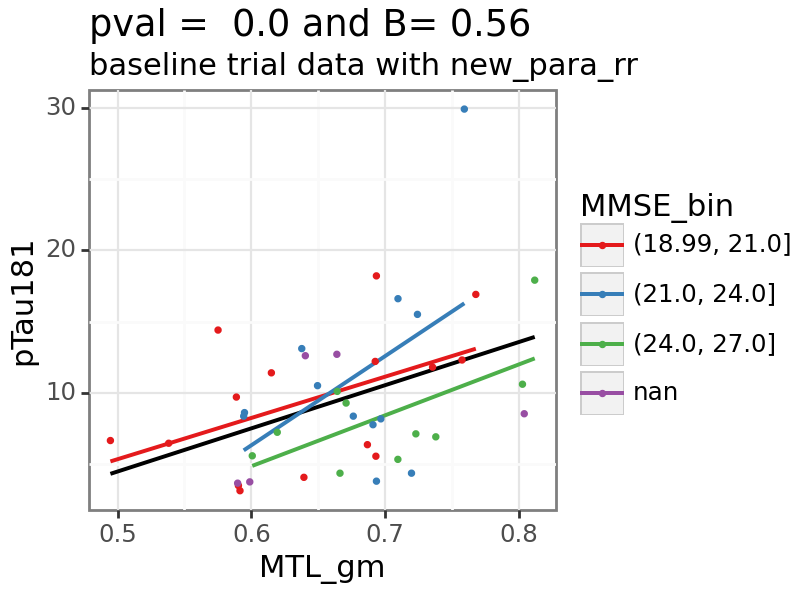

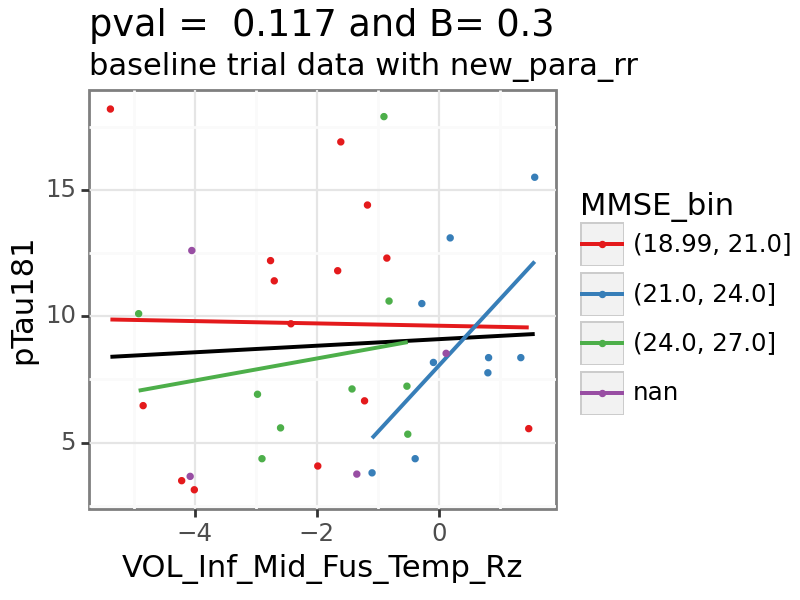

In [65]:
varx = 'pTau181'
p9.options.figure_size = (4,3)  

for vary in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [vary, varx])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('MMSE_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = vary, y = varx, color = 'MMSE_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Ab42/40 

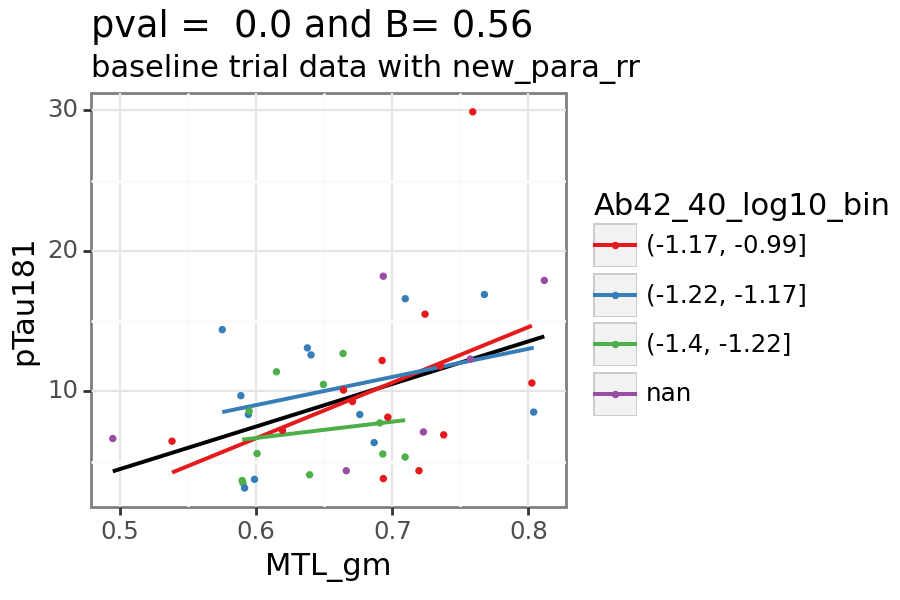

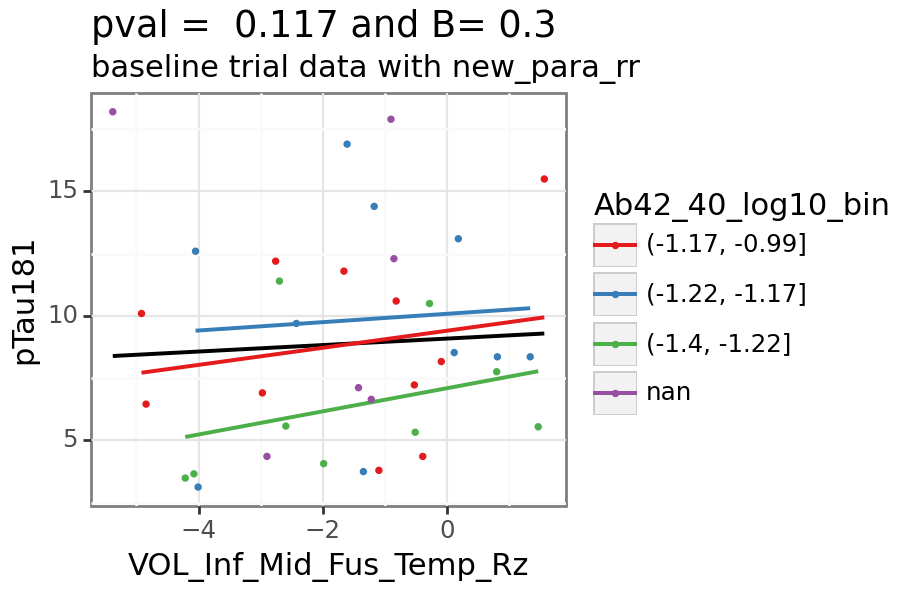

In [66]:
varx = 'pTau181'
p9.options.figure_size = (4.5,3)  

for vary in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [vary, varx])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('Ab42_40_log10_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = vary, y = varx, color = 'Ab42_40_log10_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## pTau217

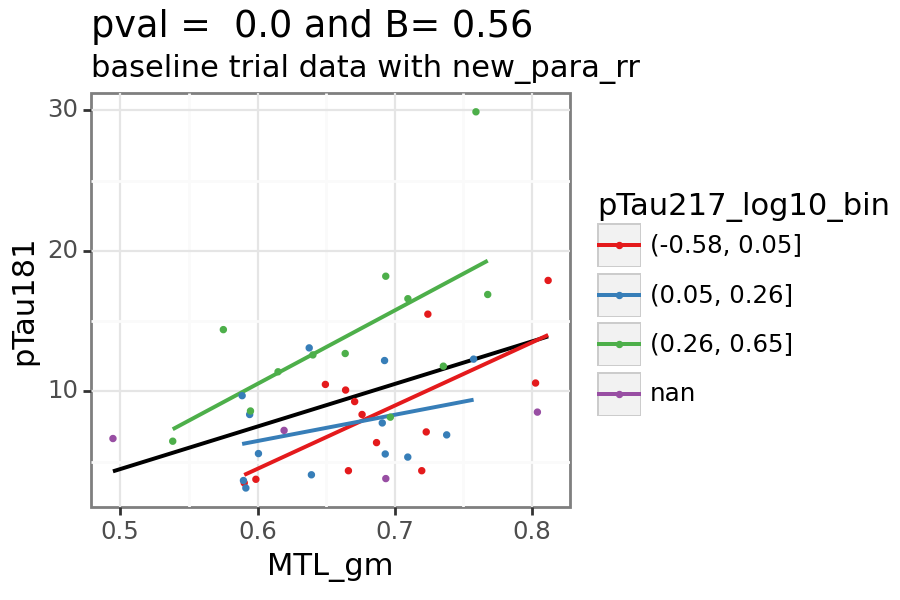

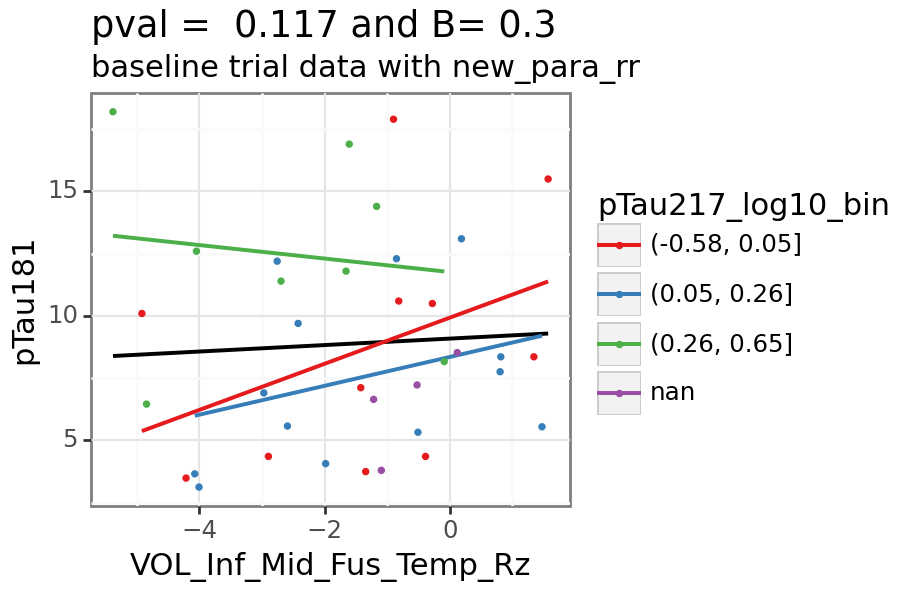

In [67]:
varx = 'pTau181'
p9.options.figure_size = (4.5,3)  

for vary in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [vary, varx])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('pTau217_log10_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = vary, y = varx, color = 'pTau217_log10_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## GFAP

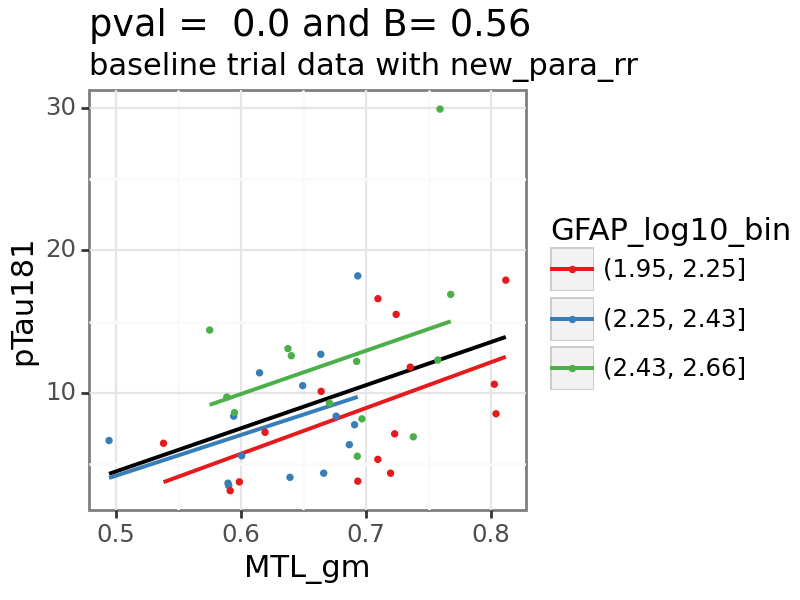

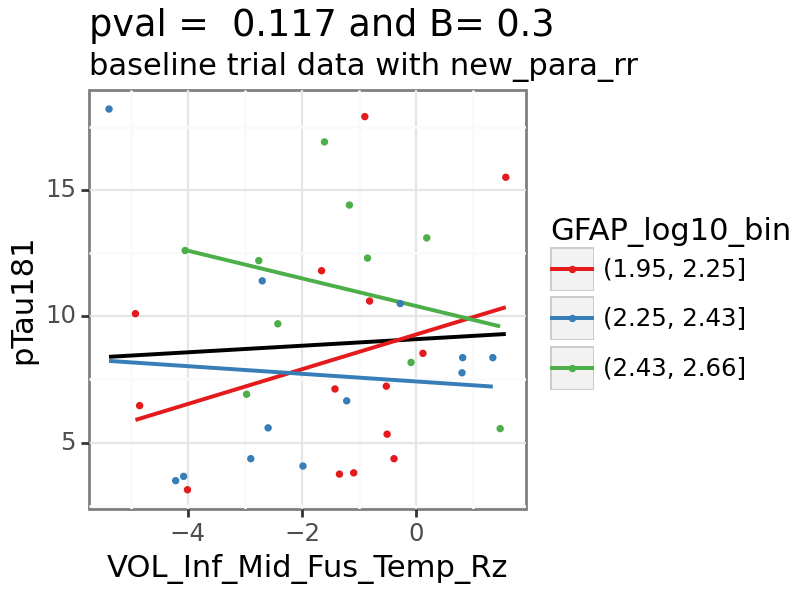

In [68]:
varx = 'pTau181'
p9.options.figure_size = (4,3)  

for vary in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [vary, varx])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('GFAP_log10_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = vary, y = varx, color = 'GFAP_log10_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## NFL

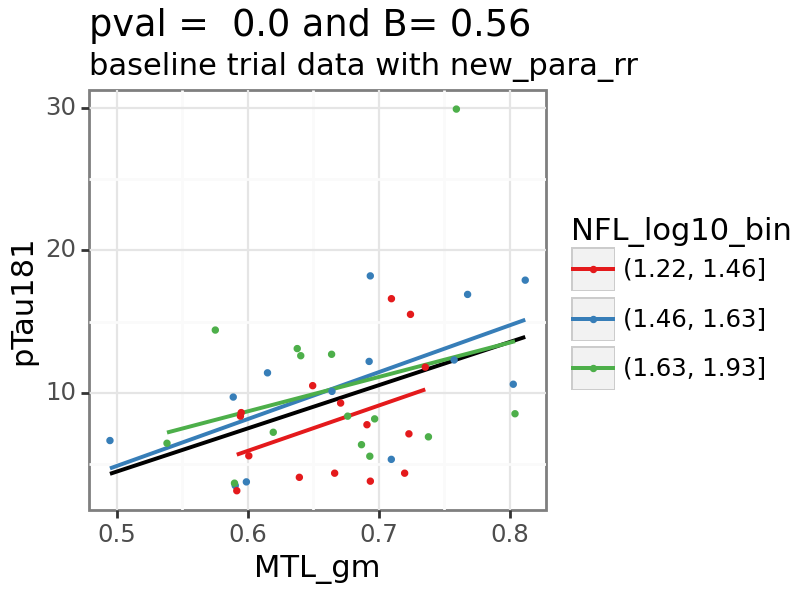

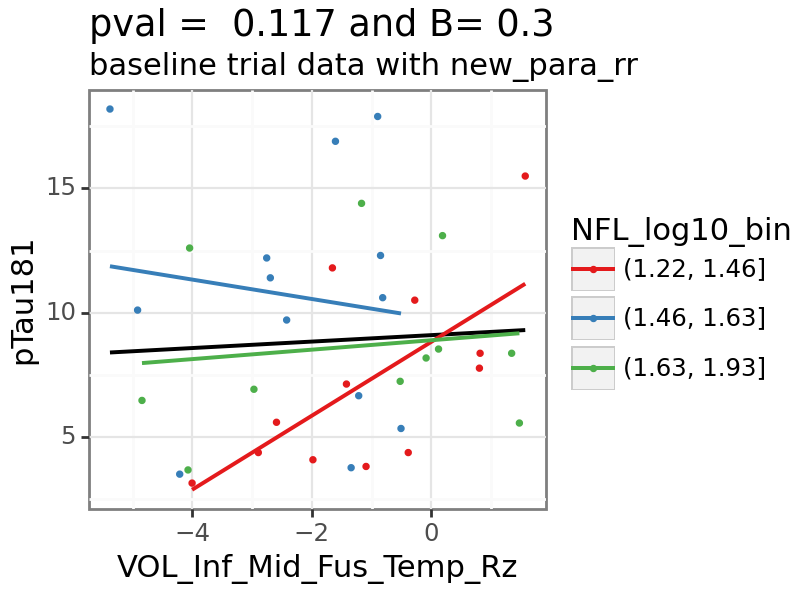

In [69]:
varx = 'pTau181'
p9.options.figure_size = (4,3)  

for vary in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [vary, varx])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('NFL_log10_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = vary, y = varx, color = 'NFL_log10_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Hip Vol

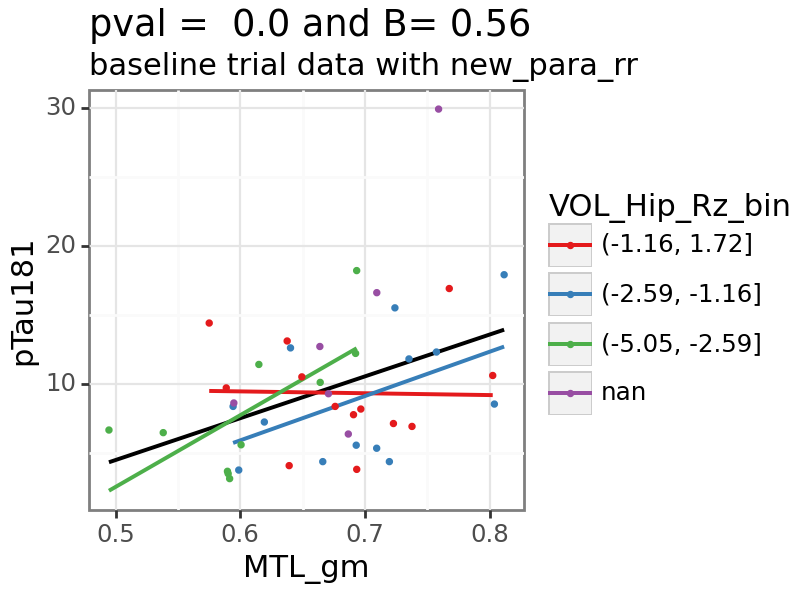

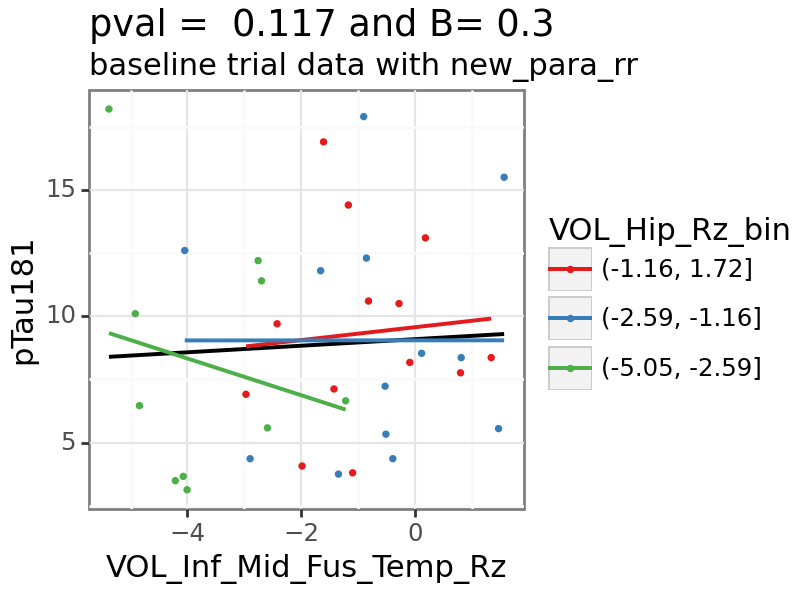

In [70]:
varx = 'pTau181'
p9.options.figure_size = (4,3)  

for vary in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [vary, varx])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('VOL_Hip_Rz_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = vary, y = varx, color = 'VOL_Hip_Rz_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

# Plot 181 & 231 with separate age decade lines

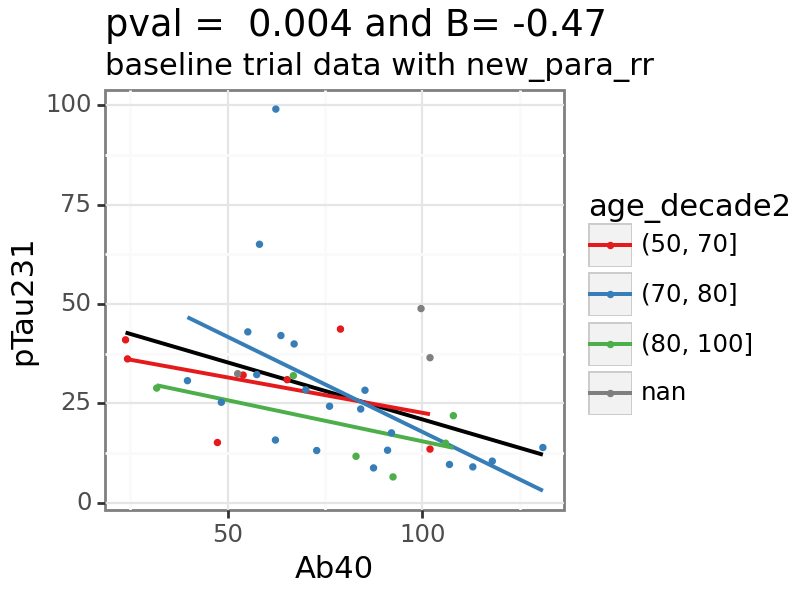

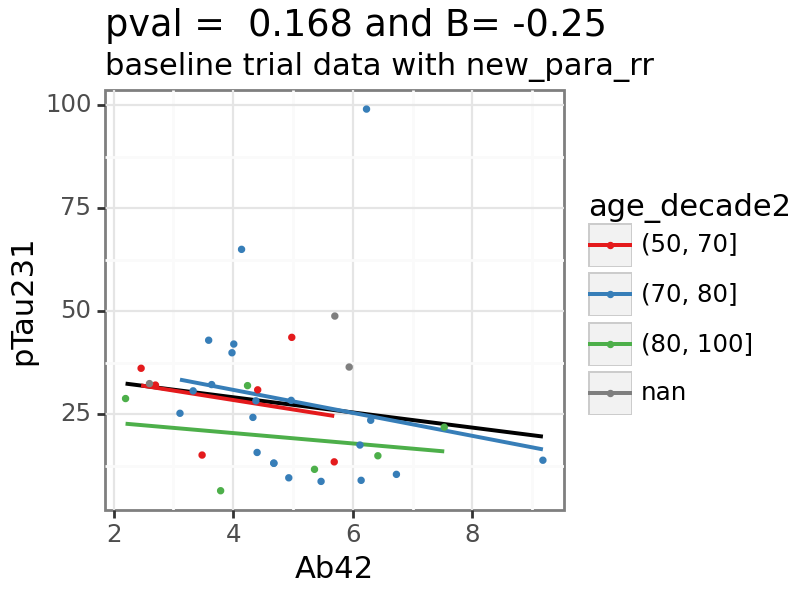

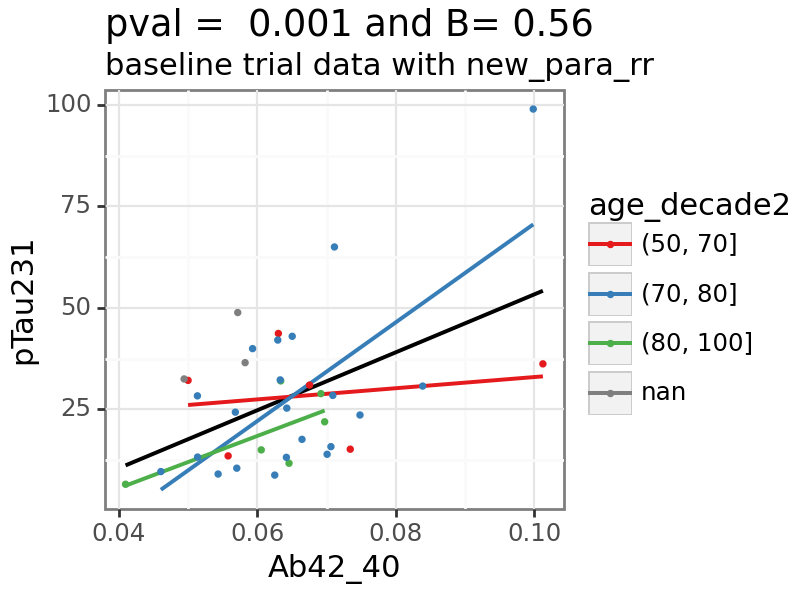

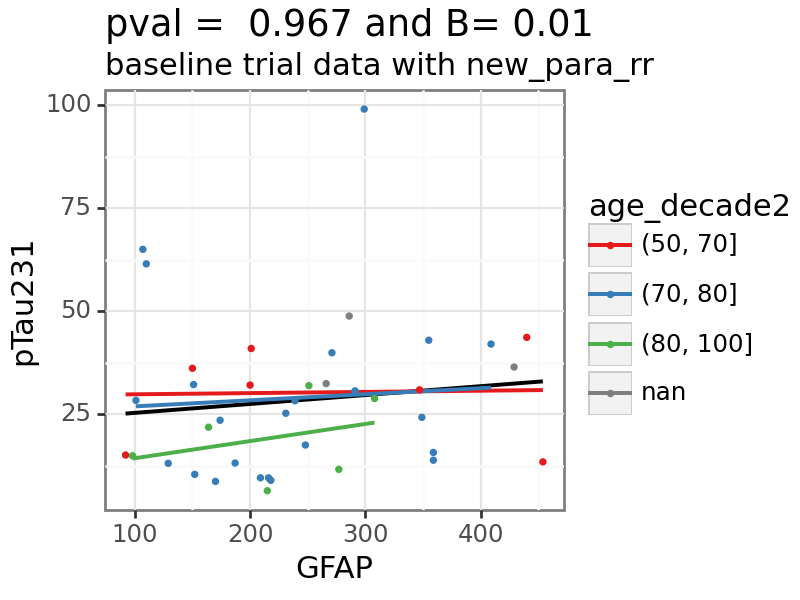

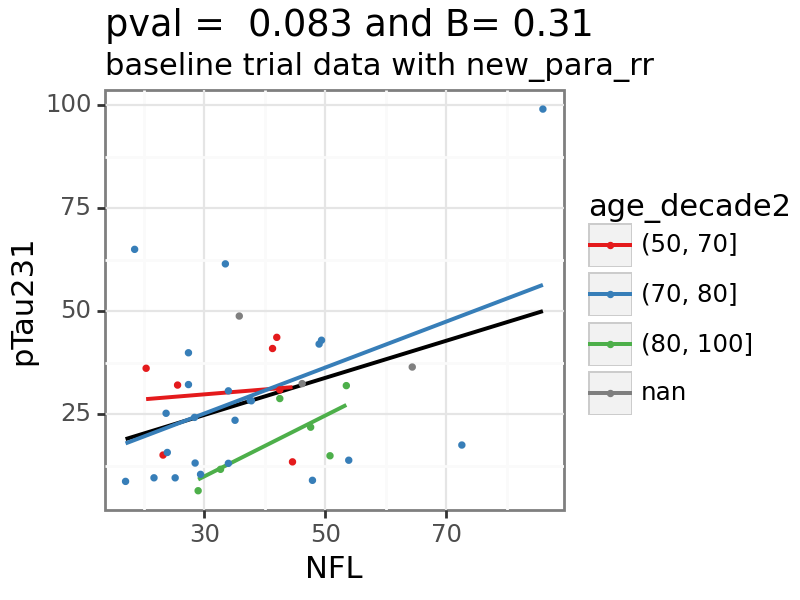

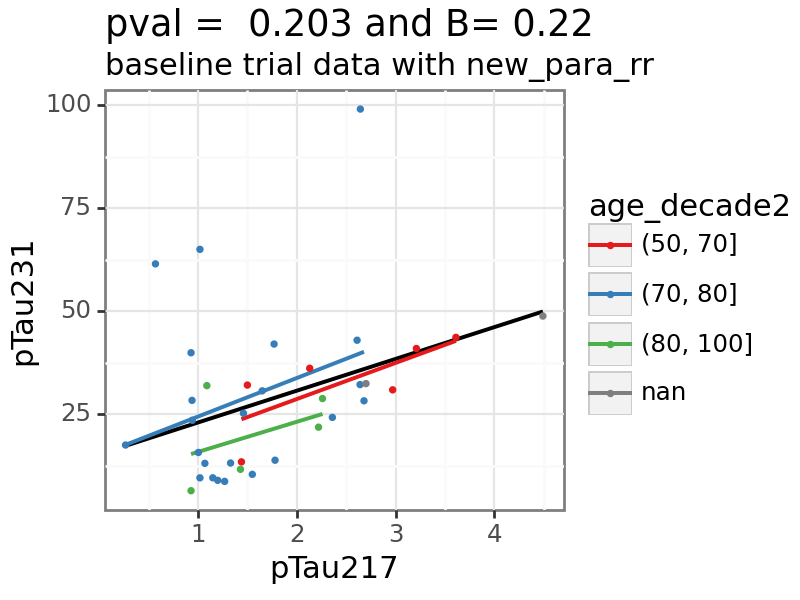

In [71]:
varx = 'pTau231'
p9.options.figure_size = (4,3)  
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['vary'].isin([vary]) & (biomarker_relationship_results_log10[selected_p_column].min(axis = 1)<graphing_pval), 
    'varx']

var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['vary'].isin([vary]) & (biomarker_relationship_results_log10['mv_age_p_val_varx']<0.05), 
    'varx'] 

for vary in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [vary, varx])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 4)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = vary, y = varx, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

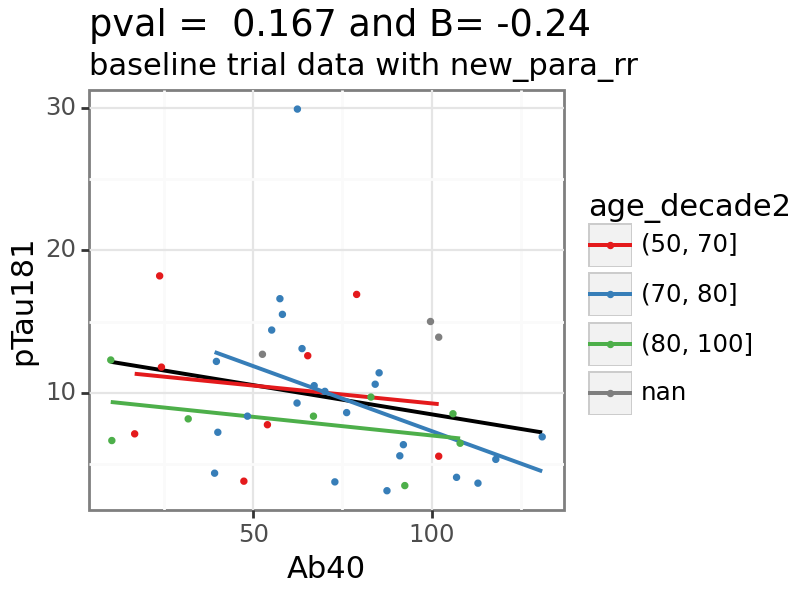

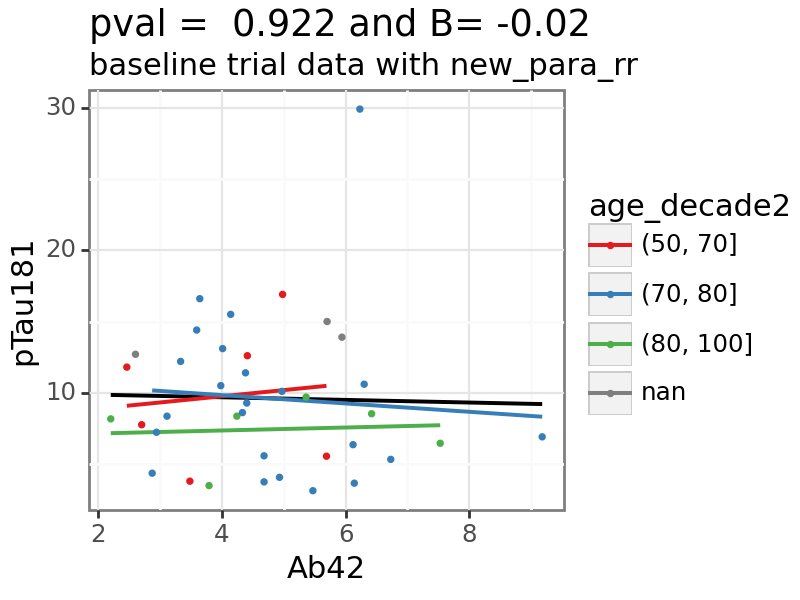

In [72]:
varx = 'pTau181'
p9.options.figure_size = (4,3)  
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['vary'].isin([vary]) & (biomarker_relationship_results_log10[selected_p_column].min(axis = 1)<graphing_pval), 
    'varx']

var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['vary'].isin([vary]) & (biomarker_relationship_results_log10['mv_age_p_val_varx']<0.05), 
    'varx'] 

for vary in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['vary'].isin([vary]) & biomarker_relationship_results_log10['varx'].isin([varx]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    
    subset_data = baseline_trial_data.dropna(subset = [vary, varx])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 5)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = vary, y = varx, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

# new

In [73]:
for var in  [ele for ele in FDG_columns if ele in all_data.columns]:

        
        temp_df_baseline =  baseline_trial_data.copy().dropna(subset = [var])

        # z-score data
        temp_df_baseline[ [var] + plasma_columns] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[var] + plasma_columns])

        model = smf.ols(formula = var + ' ~ Ab40 + Ab42 + Ab42_40 + GFAP + NFL + pTau181 + pTau217 + pTau231' , data = temp_df_baseline).fit()
        print(var, model.summary(), '\n')

MTL_gm                             OLS Regression Results                            
Dep. Variable:                 MTL_gm   R-squared:                       0.336
Model:                            OLS   Adj. R-squared:                  0.105
Method:                 Least Squares   F-statistic:                     1.454
Date:                Wed, 08 Jan 2025   Prob (F-statistic):              0.228
Time:                        10:25:33   Log-Likelihood:                -36.138
No. Observations:                  32   AIC:                             90.28
Df Residuals:                      23   BIC:                             103.5
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.2572      0.258     -0.996  

c:\Users\Lauren.Koenig\.conda\envs\Lauren_export_conda_20250102\lib\site-packages\statsmodels\regression\linear_model.py:1781: RuntimeWarning: invalid value encountered in scalar divide
c:\Users\Lauren.Koenig\.conda\envs\Lauren_export_conda_20250102\lib\site-packages\statsmodels\regression\linear_model.py:1870: RuntimeWarning: invalid value encountered in scalar divide
c:\Users\Lauren.Koenig\.conda\envs\Lauren_export_conda_20250102\lib\site-packages\statsmodels\regression\linear_model.py:956: RuntimeWarning: divide by zero encountered in log
c:\Users\Lauren.Koenig\.conda\envs\Lauren_export_conda_20250102\lib\site-packages\statsmodels\stats\stattools.py:50: RuntimeWarning: invalid value encountered in scalar divide
